In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pickle
import os
import scipy.stats as stats

In [2]:
import pandas as pd

In [3]:
data_path_1 =  '/global/cscratch1/sd/vboehm/SDSSOutlier/fc'
data_path_2 =  '/global/cscratch1/sd/vboehm/SDSSOutlier/fc_normed'
data_path_3 =  '/global/cscratch1/sd/vboehm/SDSSOutlier/cnn_normed'
#data_path_4 =  '/global/cscratch1/sd/vboehm/SDSSOutlier/cnn'

In [ ]:
encoded_train, encoded_valid, encoded_test = np.load(os.path.join(root_encoded,'encoded_AE2_%s_RUN%s.npy'%(label_2,RUN)), allow_pickle=True)


In [ ]:
root_model_data = '/global/cscratch1/sd/vboehm/Datasets/sdss/by_model/'
wlmin, wlmax    = (3388,8318)
fixed_num_bins  = 1000
min_SN          = 50
min_z           = 0.05
max_z           = 0.36
label           = 'galaxies_quasars_bins%d_wl%d-%d'%(fixed_num_bins,wlmin,wlmax)
label_          = label+'_minz%s_maxz%s_minSN%d'%(str(int(min_z*100)).zfill(3),str(int(max_z*100)).zfill(3),min_SN)
label_2         = label_+'_10_fully_connected_mean_div'

train,valid,test,le = pickle.load(open(os.path.join(root_model_data,'combined_%s_new.pkl'%label_),'rb'))

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/sklearn/base.py:315: UserWarning: Trying to unpickle estimator LabelEncoder from version 1.0.1 when using version 0.24.2. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


In [5]:
df_train = pd.read_csv(os.path.join('/global/cscratch1/sd/vboehm/SDSSOutlier/results/','training_set.csv'))
df_valid = pd.read_csv(os.path.join('/global/cscratch1/sd/vboehm/SDSSOutlier/results/','validation_set.csv'))
df_test  = pd.read_csv(os.path.join('/global/cscratch1/sd/vboehm/SDSSOutlier/results/','test_set.csv'))

In [6]:
valid_1 = pickle.load(open(os.path.join(data_path_1,'SDSS_DR16_preprocessed_test_relabeled_AE2.pkl'),'rb'))
# for ext in ['1b', '1c', '1d']:
#     valid_1.update(pickle.load(open(os.path.join(data_path_1,'SDSS_DR16_preprocessed_test_relabeled_%s.pkl'%ext),'rb')))

In [9]:
df = pd.concat([df_valid,df_test])

In [11]:
df.columns

Index(['Unnamed: 0', 'index', ' mjd', ' fiber', 'plate', 'new_label', 'RA',
       'logp_marg', 'mask_fracs', 'z', 'recon_error_std', 'recon_error',
       'max_recon_error', 'supernova', 'logp', 'logp_marg_corr'],
      dtype='object')

In [14]:
valid_1.keys(), len(valid_1['log_p_fc_AE2']), len(df)

(dict_keys(['spec', 'mask', 'noise', 'z', 'RA', 'DEC', 'class', 'subclass', 'SN', 'MJD', 'plate', 'fiber', 'mean', 'std', 'labels', 'new_inf_labels', 'max_label_fc_AE2', 'log_p_max_fc_AE2', 'log_p_fc_AE2', 'log_p_fc_AE2_marg', 'log_p_fc_AE2_marg_flat']),
 16,
 139642)

(0.6966248677245195, 0.0)


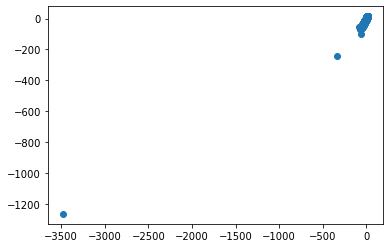

In [18]:
plt.scatter(valid_1['log_p_max_fc_AE2'],df['logp_marg'])
print(stats.pearsonr(valid_1['log_p_max_fc_AE2'],df['logp']))

In [6]:
test = pd.DataFrame.from_dict(dict((k,test[k]) for k in ('MJD','fiber','plate','new_label','RA', 'DE','logp_marg') if k in test))

In [12]:
ddf=df_test
print(ddf[(ddf['MJD']==53054)&(ddf['plate']==1436)&(ddf['fiber']==407)])
print(ddf[(ddf['MJD']==51955)&(ddf['plate']==472)&(ddf['fiber']==247)])

Empty DataFrame
Columns: [MJD, fiber, plate, RA]
Index: []
Empty DataFrame
Columns: [MJD, fiber, plate, RA]
Index: []


In [4]:
valid_2 = pickle.load(open(os.path.join(data_path_2,'SDSS_DR16_preprocessed_test_relabeled.pkl'),'rb'))

In [5]:
valid_3 = pickle.load(open(os.path.join(data_path_3,'SDSS_DR16_preprocessed_test_relabeled.pkl'),'rb'))

In [6]:
for nn in range(2,6):
    valid_1.update(pickle.load(open(os.path.join(data_path_1,'SDSS_DR16_preprocessed_test_relabeled_fc%d.pkl'%nn),'rb+')))

In [7]:
valid_1.update(pickle.load(open(os.path.join(data_path_1,'SDSS_DR16_preprocessed_test_relabeled_AE2.pkl'),'rb+')))

In [8]:
valid_1.update(valid_2)

In [9]:
valid_1.update(valid_3)

In [10]:
mask_fracs = (1000-np.sum(valid_1['mask'],axis=1))/1000

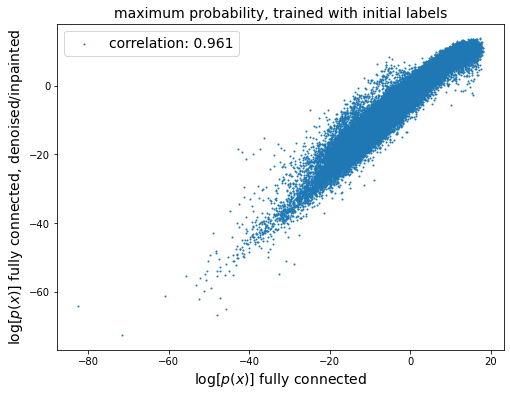

In [11]:
plt.figure(figsize=(8,6))
plt.title('maximum probability, trained with initial labels', fontsize=14)
plt.scatter(valid_1['log_p_max_fc_1'],valid_1['log_p_max_fc_AE2'], s=1, label='correlation: %.3f'%stats.pearsonr(valid_1['log_p_max_fc_1'],valid_1['log_p_max_fc_AE2'])[0])
plt.xlabel(r'$\log[p(x)]$ fully connected', fontsize=14)
plt.ylabel(r'$\log[p(x)]$ fully connected, denoised/inpainted', fontsize=14)
plt.legend( fontsize=14)
plt.show()

In [12]:
losses=[]
losses.append(np.load(os.path.join(data_path_1,'mean_loss_fc.npy')))
for ii in range(2,6):
    losses.append(np.load(os.path.join(data_path_1,'mean_loss_fc_%d.npy'%ii)))

In [13]:
AE_losses = np.mean(np.asarray(losses),axis=1)

In [14]:
decoded = np.load(os.path.join(data_path_1,'decoded_fc_5.npy'),allow_pickle=True)[1]

In [15]:
logp_losses = [np.mean(valid_1['log_p_max_fc_AE2'])]
for ii in range(2,6):
    logp_losses.append(np.mean(valid_1['log_p_max_fc%d_1d'%ii]))
logp_losses=np.asarray(logp_losses)

In [16]:
logp_weights = (1./logp_losses)/np.sum(1./logp_losses)

In [17]:
logp_losses

array([-1.35214335, -1.71986407, -1.37303089, -0.8101266 , -1.09637682])

In [18]:
AE_weights = np.squeeze((1./(AE_losses-1))/np.sum(1./(AE_losses-1)))

In [19]:
logp_weights, AE_weights

(array([0.1762638 , 0.13857719, 0.17358235, 0.29419344, 0.21738322]),
 array([0.20071775, 0.19528046, 0.19798565, 0.18274091, 0.22327522]))

In [39]:
weights = [1,0,0,0,0]#(logp_weights+AE_weights)/sum((logp_weights+AE_weights)) #mask_fracs = (1000-np.sum(valid_1['mask'],axis=1))/1000

In [40]:
logp_max_comb = weights[0]*valid_1['log_p_max_fc_AE2']
for ii in range(2,6):
    logp_max_comb+=weights[ii-1]*valid_1['log_p_max_fc%d_1d'%ii]

In [41]:
logp_comb = weights[0]*valid_1['log_p_fc_AE2']
for ii in range(2,6):
    logp_comb+=weights[ii-1]*valid_1['log_p_fc%d_1d'%ii]
    
labels  = np.argmax(logp_comb,axis=0)

In [7]:
import pandas as pd
Supernovas = pd.read_pickle('../forPub/Supernova_Sample.pkl')
df_valid   = pd.DataFrame.from_dict(dict((k,valid_1[k]) for k in ('MJD','fiber','plate','z') if k in valid_1))

In [8]:
for df in [df_valid]:
    sns = df.reset_index().merge(test, on=['MJD','plate','fiber'])
    print(sns)
    df['test_set']=np.zeros(len(df['MJD']))
    df.loc[sns['index'],'test']=1

        index    MJD  fiber  plate         z          RA
0       69820  53463    219   1763  0.115739  179.494217
1       69821  53055    308   1443  0.198938  171.404846
2       69822  54176    622   2485  0.059275  165.940643
3       69823  51901    575    457  0.115170   44.147957
4       69824  53765    427   2374  0.120199  154.613876
...       ...    ...    ...    ...       ...         ...
69817  139637  53431    533   1979  0.120595  171.139038
69818  139638  53415    396   1942  0.214240  143.883118
69819  139639  53115    556   1467  0.056300  212.047012
69820  139640  53033    623   1356  0.056580  152.665558
69821  139641  52072     17    602  0.209776  199.046967

[69822 rows x 6 columns]


69822.0

In [56]:
valid_1['log_p_fc_AE2_marg'][92955], valid_1['max_label_fc_AE2'][92955]#,valid_1['log_p_max_fc_marg'][92955]

(-22.704126100601858, 4)

In [41]:
valid_1.keys()

dict_keys(['spec', 'mask', 'noise', 'z', 'RA', 'DEC', 'class', 'subclass', 'SN', 'MJD', 'plate', 'fiber', 'mean', 'std', 'labels', 'new_inf_labels', 'max_label_fc_AE2', 'log_p_max_fc_AE2', 'log_p_fc_AE2', 'log_p_fc_AE2_marg', 'log_p_fc_AE2_marg_flat'])

In [35]:
ddf = df_valid
print(ddf[(ddf['MJD']==53054)&(ddf['plate']==1436)&(ddf['fiber']==407)])
print(ddf[(ddf['MJD']==51955)&(ddf['plate']==472)&(ddf['fiber']==247)])

          MJD  fiber  plate        z
116382  53054    407   1436  0.14084
         MJD  fiber  plate         z
92955  51955    247    472  0.070203


In [10]:
_, num = np.unique(valid_1['max_label_fc_AE2'], return_counts=True)
logprior = np.log(num/sum(num))

In [14]:
import scipy

In [43]:
dd = df_valid
dd['log_p_fc_marg']      = scipy.special.logsumexp(logprior[:,None]+valid_1['log_p_fc_AE2'], axis=0)
dd['log_p_fc_marg_flat'] = scipy.special.logsumexp(valid_1['log_p_fc_AE2'], axis=0)

In [44]:
valid_1.keys()

dict_keys(['spec', 'mask', 'noise', 'z', 'RA', 'DEC', 'class', 'subclass', 'SN', 'MJD', 'plate', 'fiber', 'mean', 'std', 'labels', 'new_inf_labels', 'max_label_fc_AE2', 'log_p_max_fc_AE2', 'log_p_fc_AE2', 'log_p_fc_AE2_marg', 'log_p_fc_AE2_marg_flat'])

In [10]:
df_valid['logp'] =valid_1['log_p_fc_AE2_marg']
df_valid['label']=valid_1['max_label_fc_AE2']

In [11]:
df_valid=df_valid[df_valid['test']==1]

In [59]:
for df in [df_valid]:
    sns = df.reset_index().merge(Supernovas, on=['MJD','plate','fiber'])
    print(sns)
    df['supernova']=np.zeros(len(df['MJD']))
    df.loc[sns['index'],'supernova']=1

   index    MJD  fiber  plate         z  log_p_fc_marg  log_p_fc_marg_flat  \
0  11444  51883    171    271  0.065088      -0.315603            0.498623   
1  55237  51981    379    549  0.133955      -3.163077           -2.281968   
2  63126  51818    181    358  0.122440     -14.825498          -13.601139   
3  77069  51633    572    268  0.088002       1.391204            2.662555   
4  81400  52079    209    604  0.135729      -8.990075           -7.161787   
5  92955  51955    247    472  0.070203     -22.704126          -20.288597   

        logp  label  
0  -0.315603      0  
1  -3.163077      0  
2 -14.825498      6  
3   1.391204      6  
4  -8.990075      1  
5 -22.704126      4  


In [12]:
def split_in_equal_bins(data, num_bins, sort_by, logp, num):
    ppb  = len(data)//num_bins
    data = data.sort_values(sort_by)
    bin_edges = [0]
    outliers  = []
    for ii in range(num_bins):
        dd = data.iloc[ii*ppb:(ii+1)*ppb]
        bin_edges.append(dd[sort_by].iloc[-1])
        dd = dd.sort_values(logp)
        outliers.append(dd.iloc[0:num])
    return bin_edges, outliers

In [13]:
bin_edges, ood = split_in_equal_bins(df_valid[df_valid['label']==0], num_bins=10, sort_by='z', logp='logp', num=20)
len(ood[0])

20

In [17]:
len(df_valid)

69822

In [53]:
#pickle.dump([bin_edges,ood],open(os.path.join(data_path_1,'AE2_results_class0.pkl'),'wb'))

In [63]:
# df1 = pickle.load(open(os.path.join(data_path_1,'AE2_results_class1.pkl'),'rb'))[1][1]
# df2 = pickle.load(open(os.path.join(data_path_1,'ensemble_results_class1.pkl'),'rb'))[1][1]

In [67]:
df1.merge(df1)

,MJD,fiber,plate,z,logp,label,supernova
0,51691,640,350,0.082157,-26.843473,1,0.0
1,51930,568,285,0.085270,-20.535908,1,0.0
2,53880,15,2208,0.083351,-18.198675,1,0.0
3,53815,348,2224,0.083544,-18.037281,1,0.0
4,51959,322,283,0.076959,-16.859985,1,0.0
5,52224,429,722,0.082960,-14.356767,1,0.0
6,53735,196,2296,0.084512,-14.335101,1,0.0
7,51989,274,363,0.085599,-13.796507,1,0.0
8,53327,499,1928,0.084111,-13.654837,1,0.0
9,52345,102,613,0.076145,-13.497951,1,0.0


In [65]:
df2

,MJD,fiber,plate,z,logp,label,supernova
50362,53794,576,2243,0.074790,-13.019561,1,0.0
62453,53815,348,2224,0.083544,-13.014285,1,0.0
45466,53735,196,2296,0.084512,-11.888165,1,0.0
50258,51691,640,350,0.082157,-11.832535,1,0.0
9712,51989,274,363,0.085599,-10.966138,1,0.0
42150,52224,429,722,0.082960,-10.353122,1,0.0
14940,53883,82,1717,0.078667,-9.802213,1,0.0
62853,53531,262,1827,0.080946,-9.490744,1,0.0
39137,53050,247,1740,0.080535,-8.783399,1,0.0
35096,51930,512,285,0.077403,-8.572799,1,0.0


In [48]:

indices = np.where((labels==0)|(labels==1))
ind     = np.argsort(logp_max_comb)[indices]

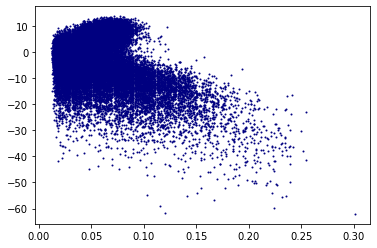

In [49]:
plt.scatter(mask_fracs[ind],logp_max_comb[ind],s=1,color='navy')
plt.show()

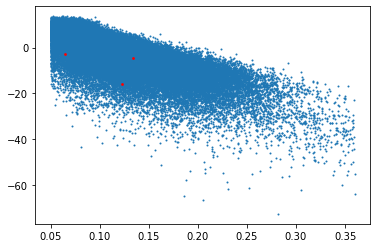

In [50]:
plt.scatter(valid_1['z'],logp_max_comb, s=1)
plt.scatter(valid_1['z'][sns['index']],logp_max_comb[sns['index']], s=3,color='red')
plt.show()

In [15]:
decoded_train, decoded = np.load(os.path.join(data_path_1,'decoded_fc.npy'), allow_pickle=True)

In [ ]:
### we are getting all the spectra that we had before + more

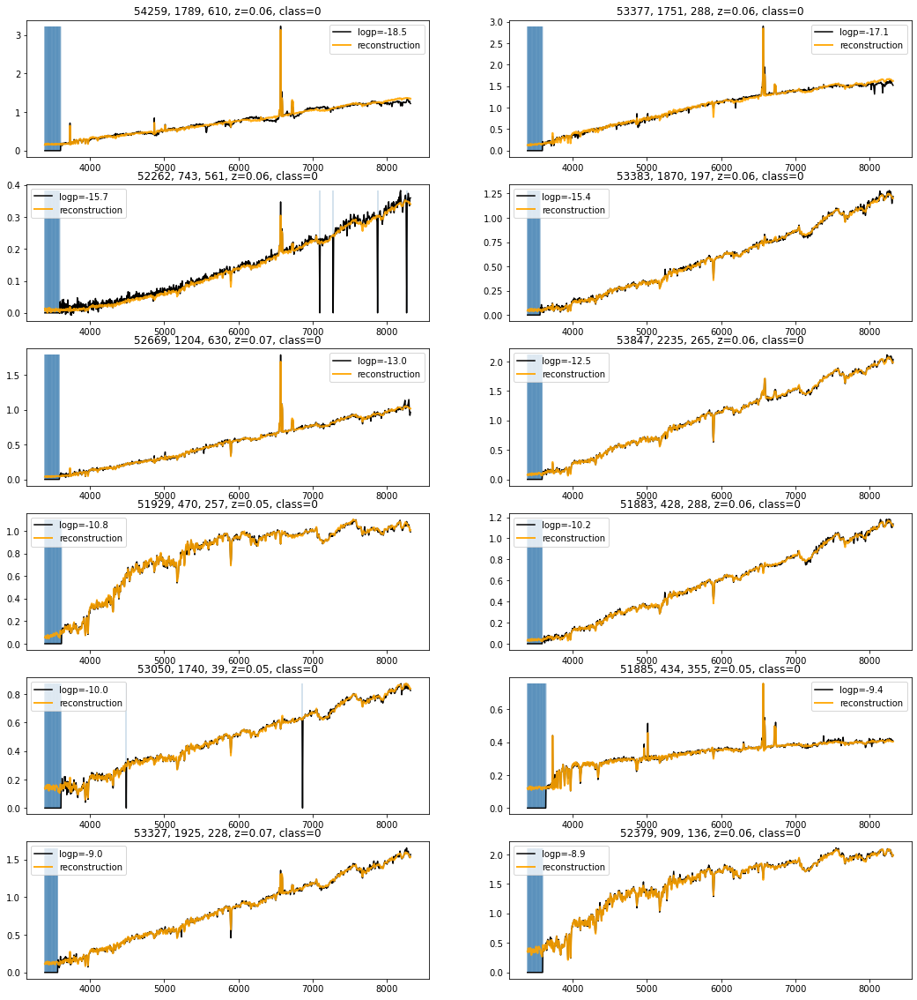

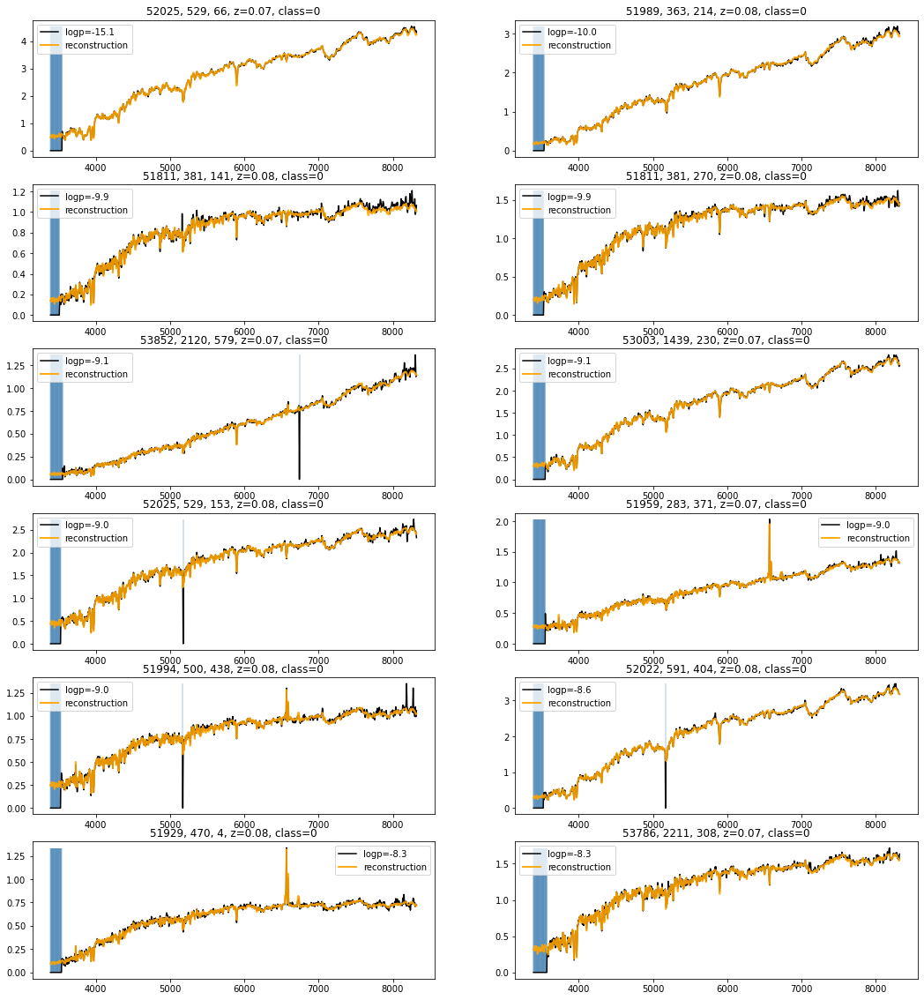

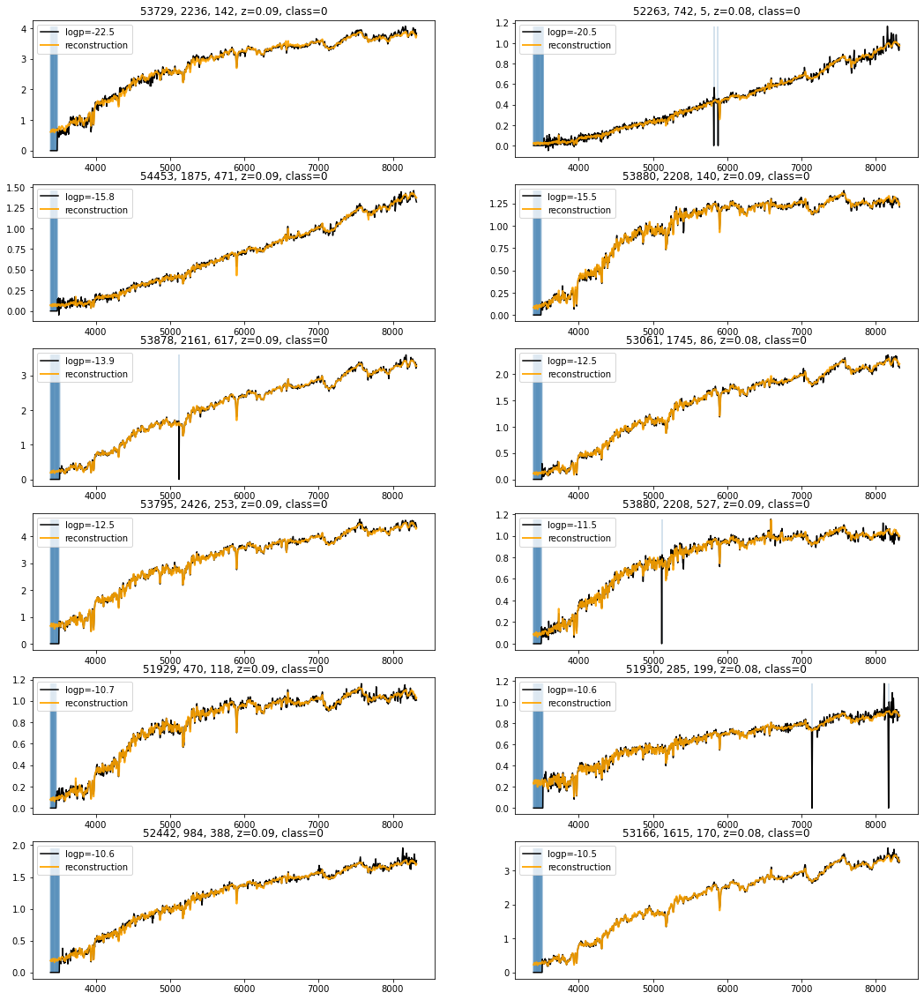

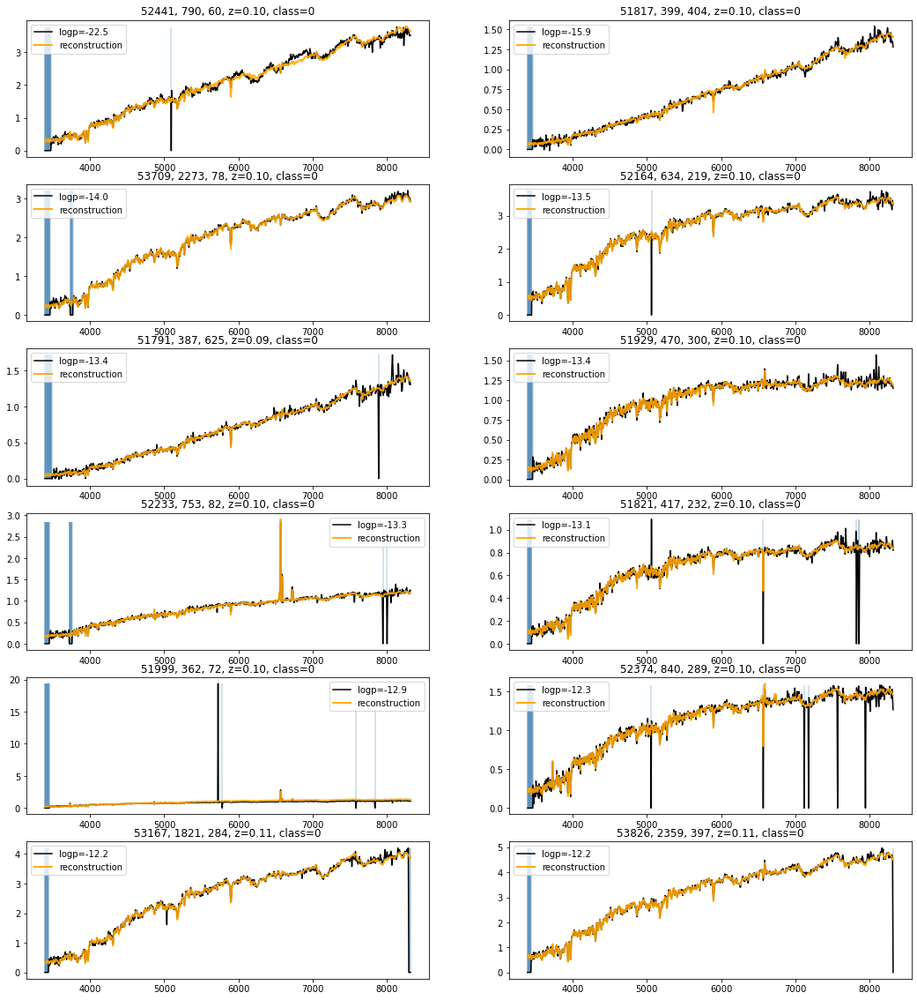

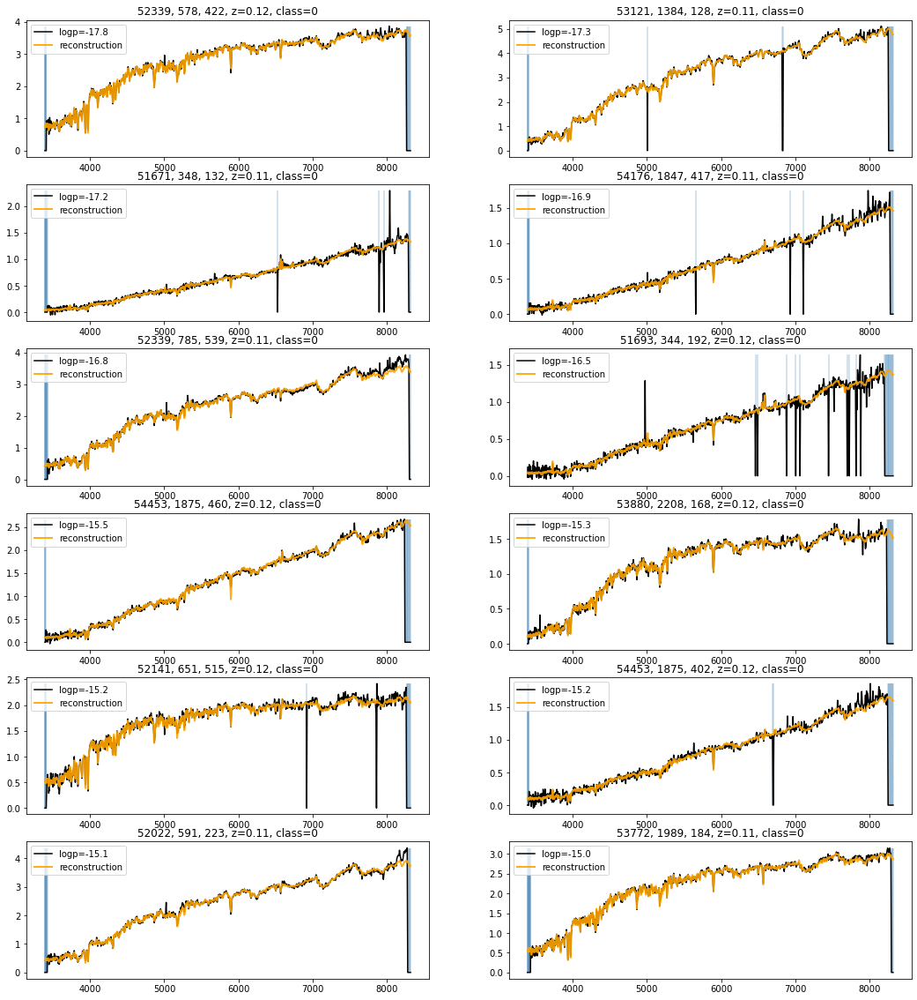

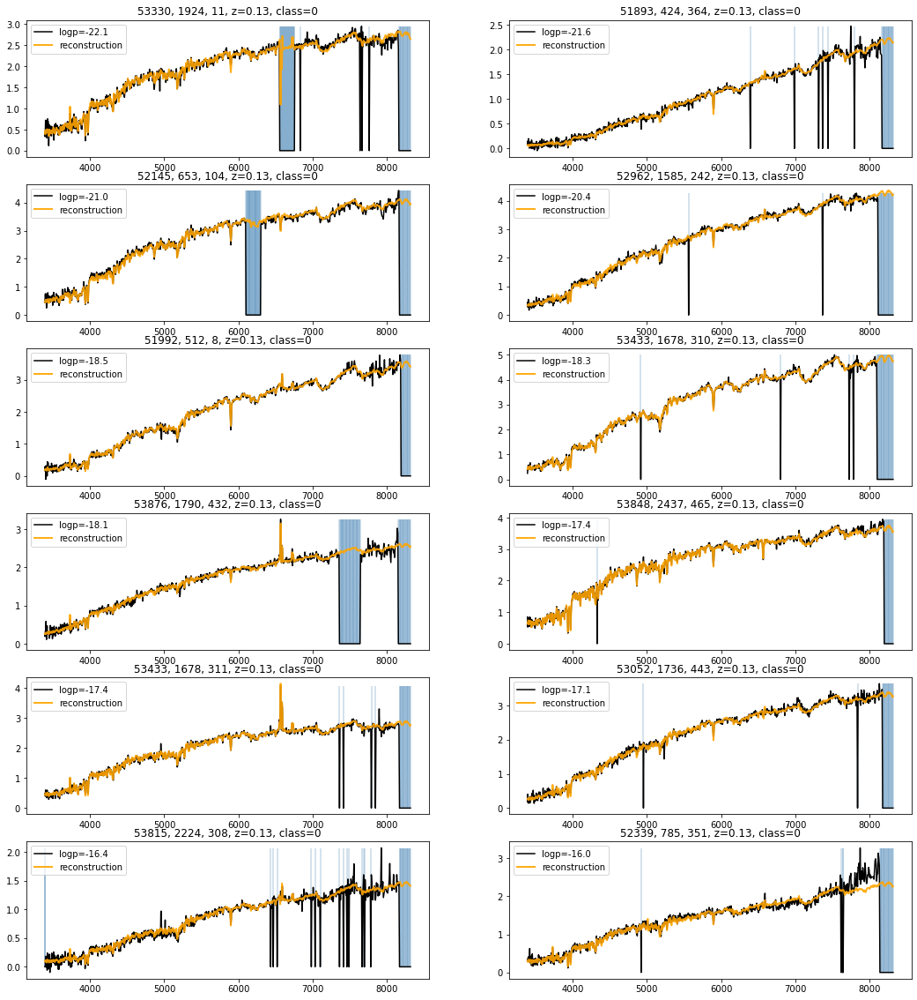

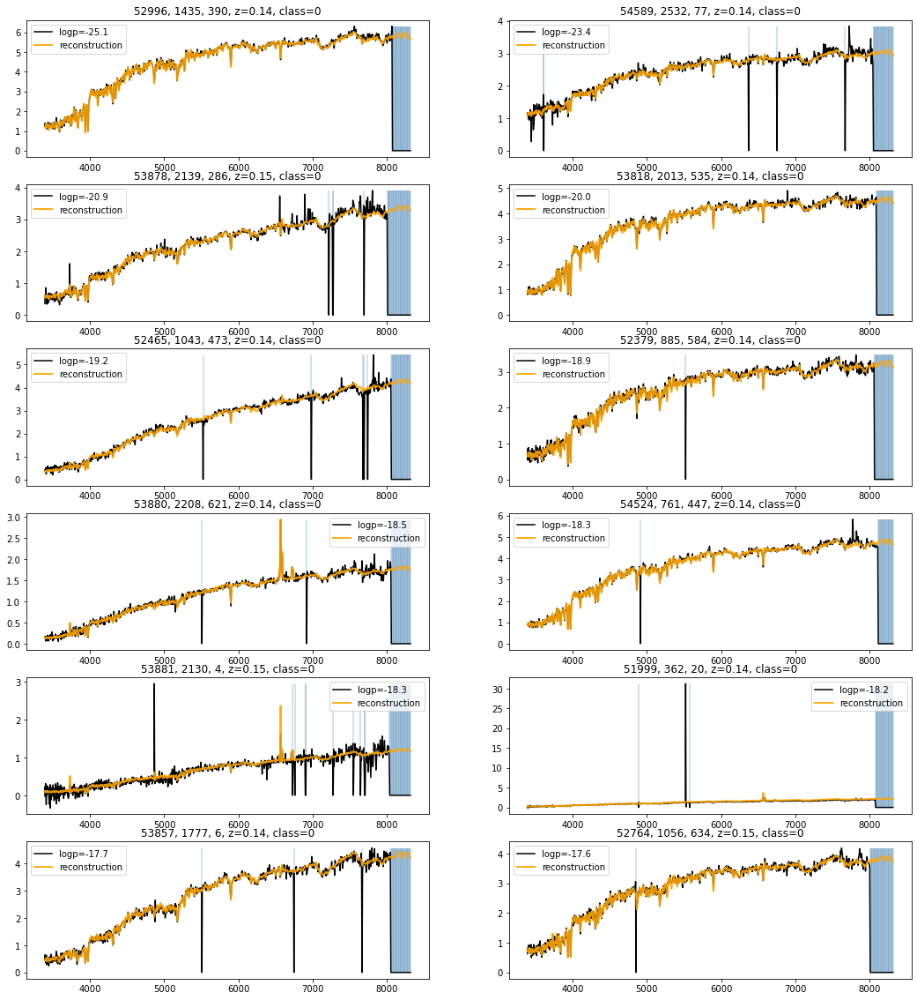

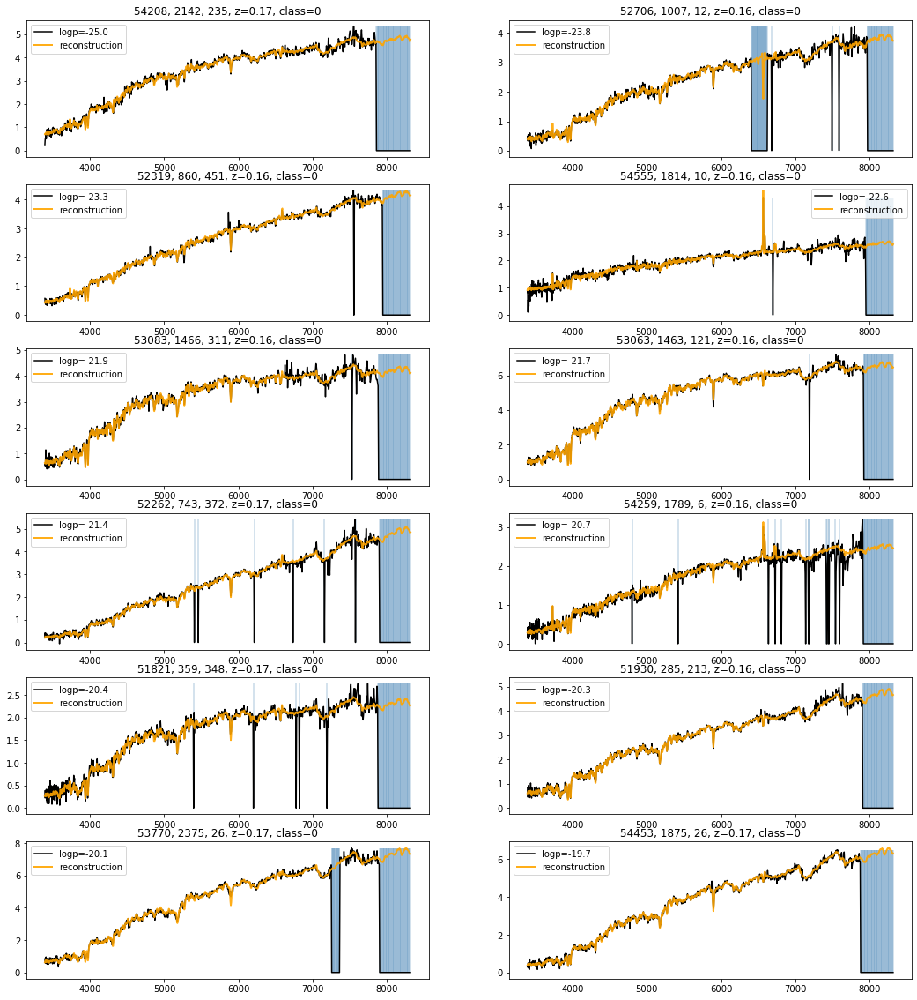

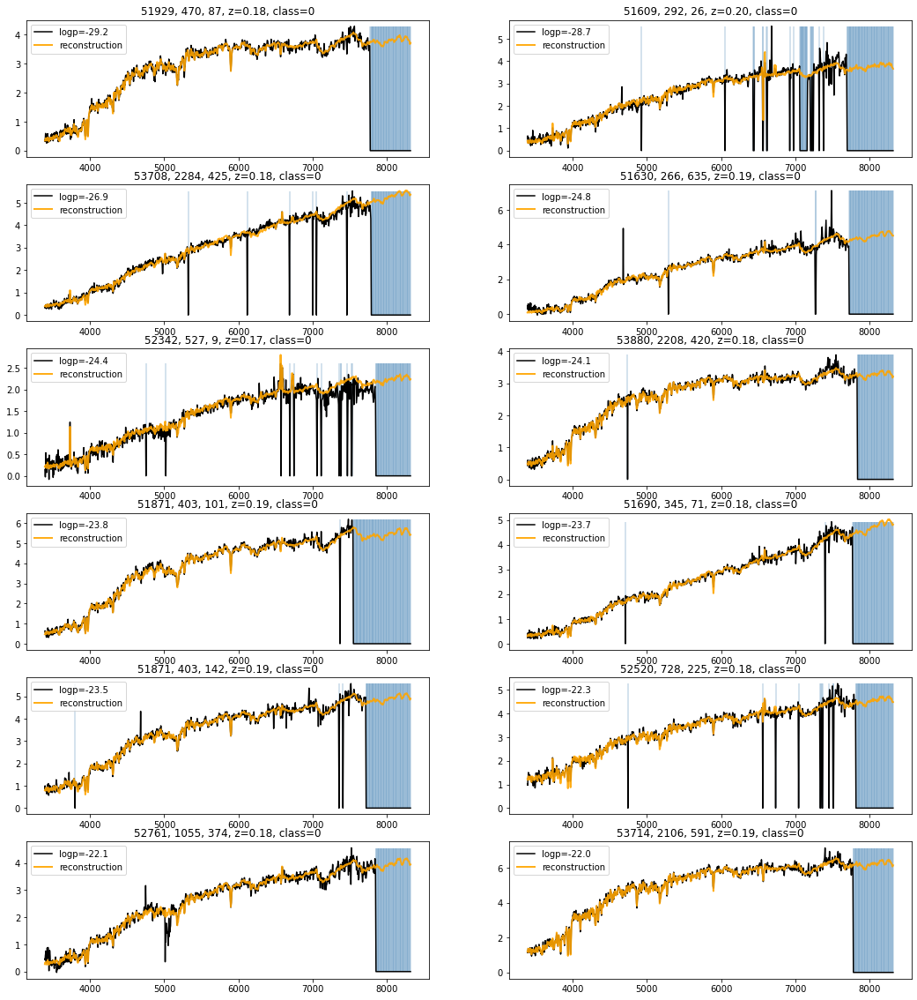

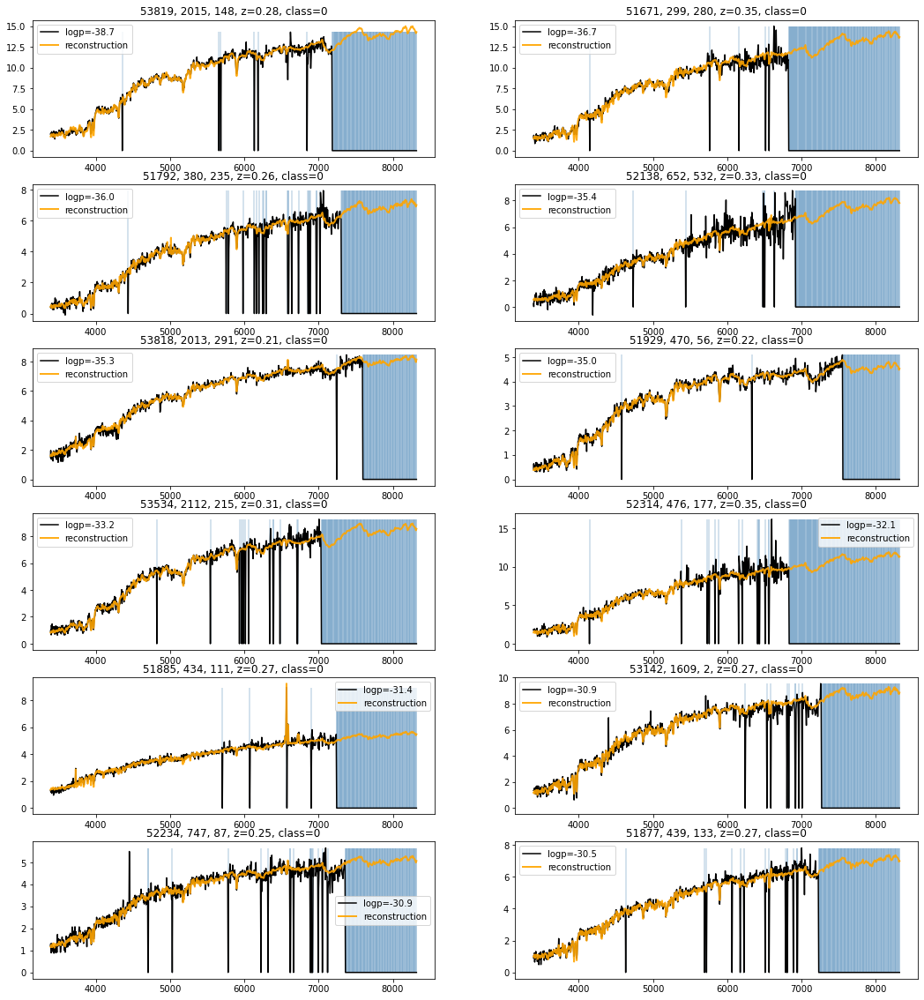

In [18]:
wlmin, wlmax      = (3388,8318)
fixed_num_bins    = 1000
wl_range          = (np.log10(wlmin),np.log10(wlmax))
new_wl            = np.logspace(wl_range[0],wl_range[1],fixed_num_bins+1)

for nn, data in enumerate(ood):
    fi, ax = plt.subplots(6,2,figsize=(18,20))
    ax  = ax.flatten()wlmin, wlmax      = (3388,8318)
fixed_num_bins    = 1000
wl_range          = (np.log10(wlmin),np.log10(wlmax))
new_wl            = np.logspace(wl_range[0],wl_range[1],fixed_num_bins+1)

for nn, data in enumerate(ood):
    fi, ax = plt.subplots(6,2,figsize=(18,20))
    ax  = ax.flatten()
    ind = data.index
    for jj in range(12):
        ii = ind[jj]
        ax[jj].set_title('%d, %d, %d, z=%.2f, class=%d'%(data['MJD'].loc[ii],data['plate'].loc[ii],data['fiber'].loc[ii],data['z'].loc[ii],data['label'].loc[ii]))
        ax[jj].plot(new_wl[1:],valid_1['spec'][ii], color='black',label='logp=%.1f'%data['logp'].loc[ii])
        ax[jj].vlines(x=new_wl[1:][np.squeeze(~valid_1['mask'][ii].astype(bool))], ymin=0,ymax=max(valid_1['spec'][ii]), color='steelblue',alpha=0.3)
        ax[jj].plot(new_wl[1:],decoded[ii], label='reconstruction',ls='-', color='orange', lw=2,alpha=0.9)

        ax[jj].legend()
    ind = data.index
    for jj in range(12):
        ii = ind[jj]
        ax[jj].set_title('%d, %d, %d, z=%.2f, class=%d'%(data['MJD'].loc[ii],data['plate'].loc[ii],data['fiber'].loc[ii],data['z'].loc[ii],data['label'].loc[ii]))
        ax[jj].plot(new_wl[1:],valid_1['spec'][ii], color='black',label='logp=%.1f'%data['logp'].loc[ii])
        ax[jj].vlines(x=new_wl[1:][np.squeeze(~valid_1['mask'][ii].astype(bool))], ymin=0,ymax=max(valid_1['spec'][ii]), color='steelblue',alpha=0.3)
        ax[jj].plot(new_wl[1:],decoded[ii], label='reconstruction',ls='-', color='orange', lw=2,alpha=0.9)

        ax[jj].legend()
#     if ii in [10,11]:
#         ax[ii].set_xlabel(r'restframe $\lambda$ [nm]')
#     if ii%2==0:
#         ax[ii].set_ylabel(r'standardized flux')        
# plt.tight_layout()
    plotpath='/global/cscratch1/sd/vboehm/SDSSOutlier/fc/plots'
    #plt.savefig(os.path.join(plotpath,'logp_AE2_outliers_class0_zbin_%d.pdf'%nn), bbox_inches='tight')
    plt.show()
# plt.close()

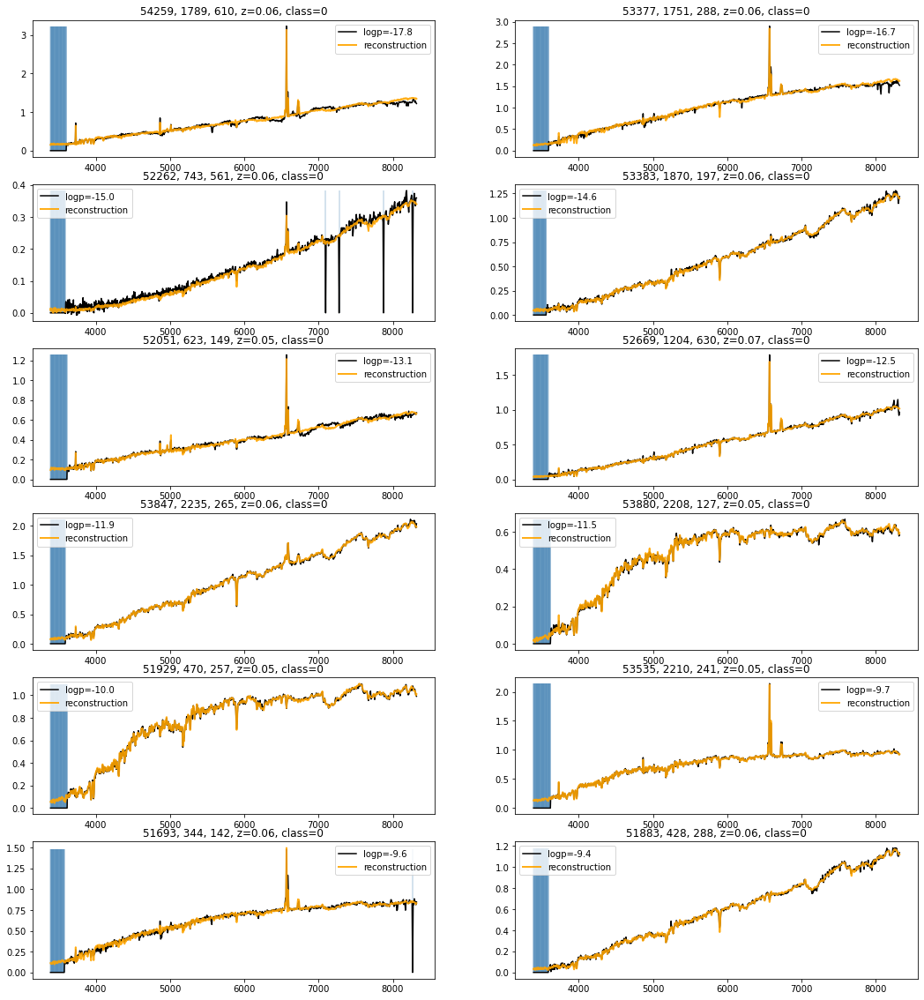

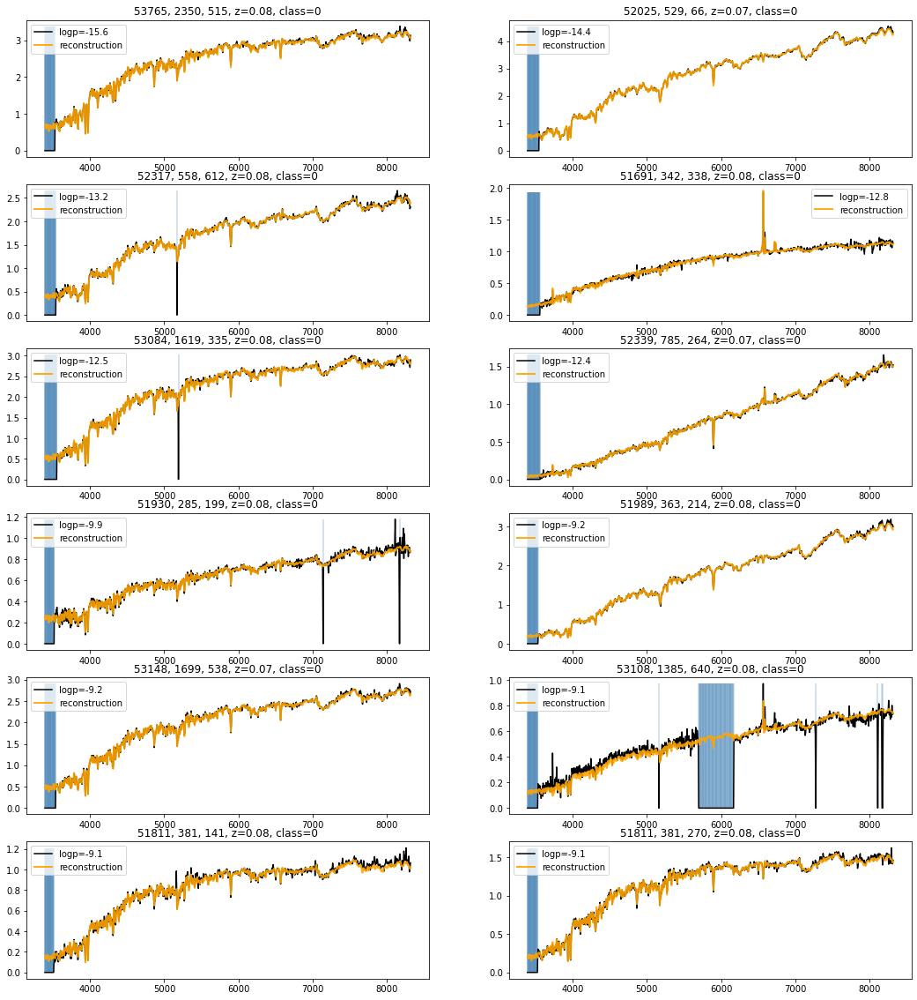

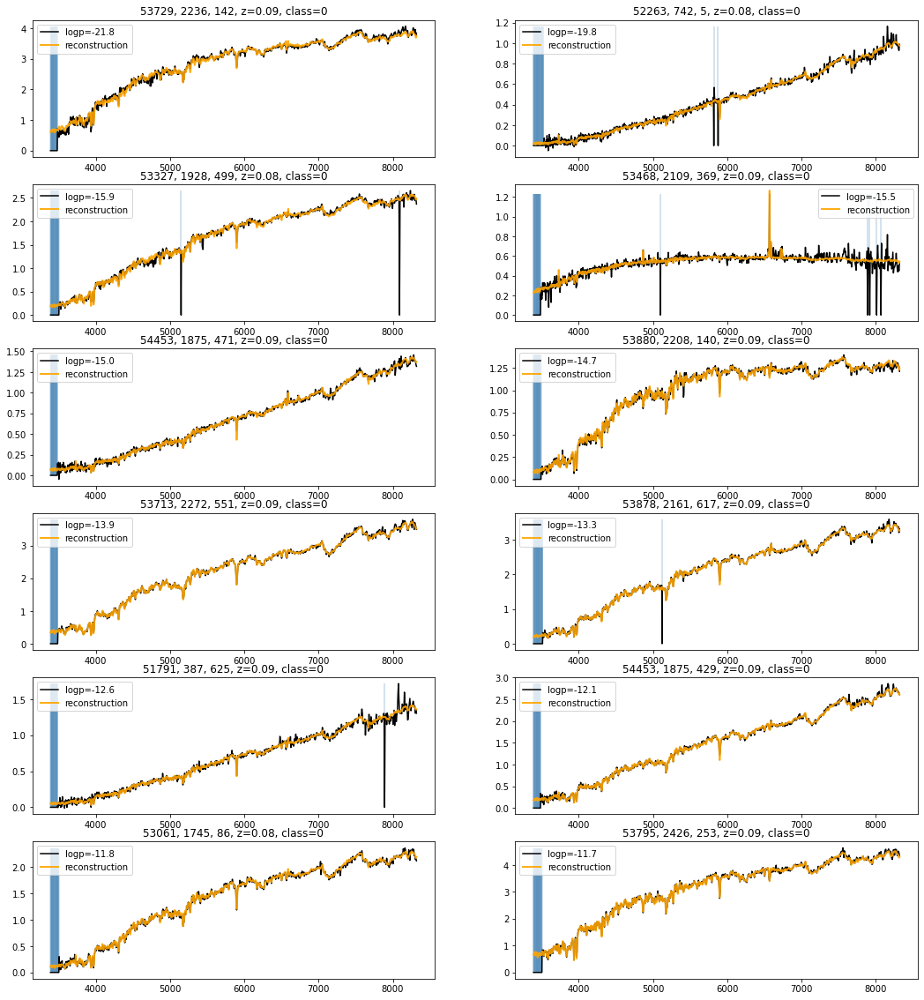

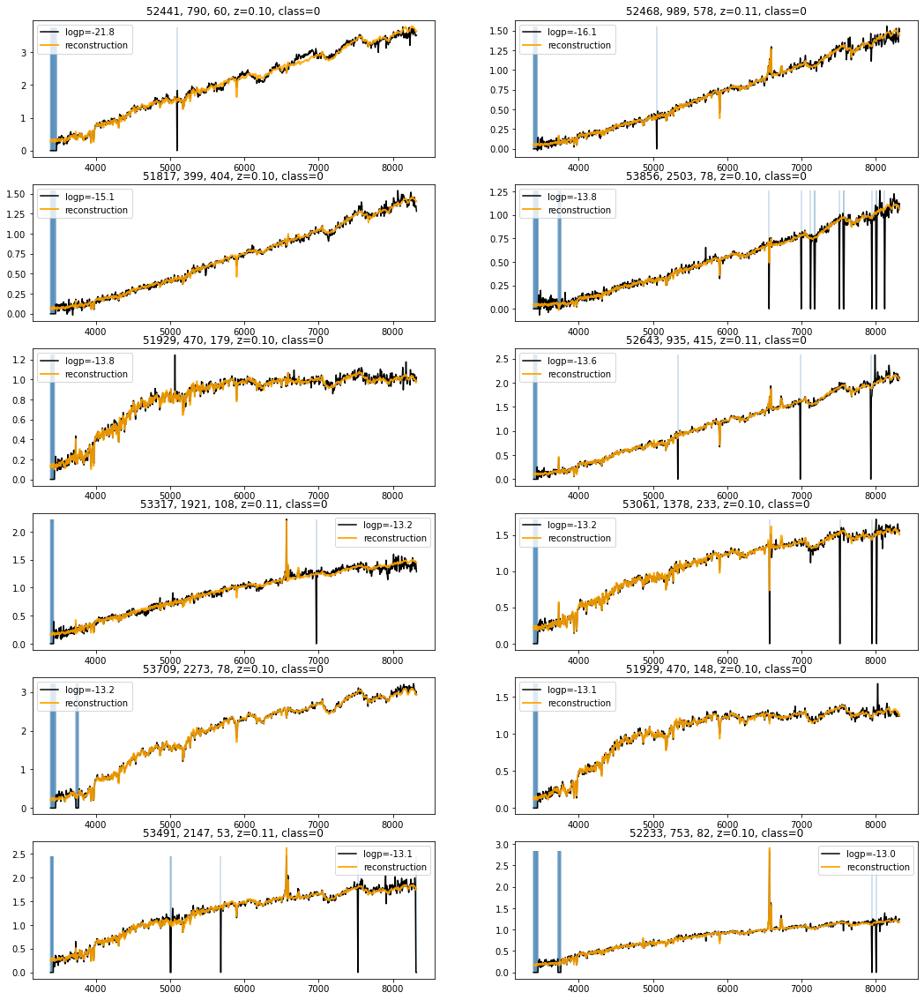

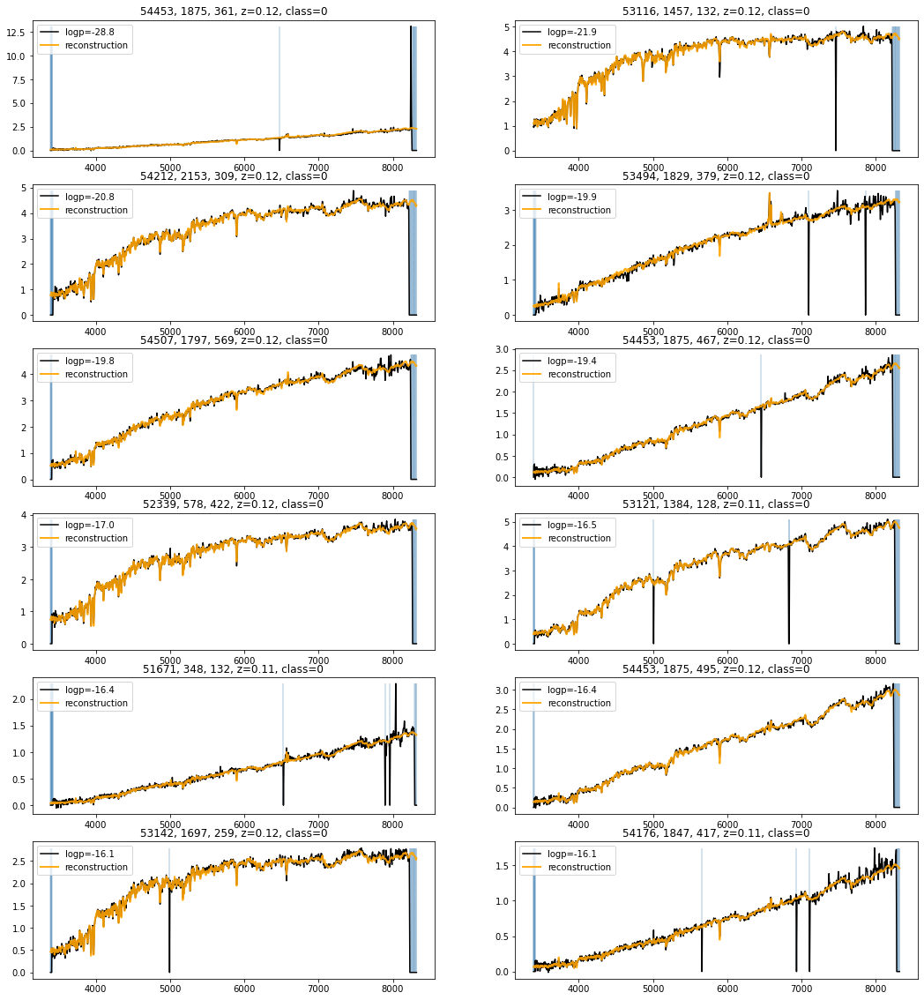

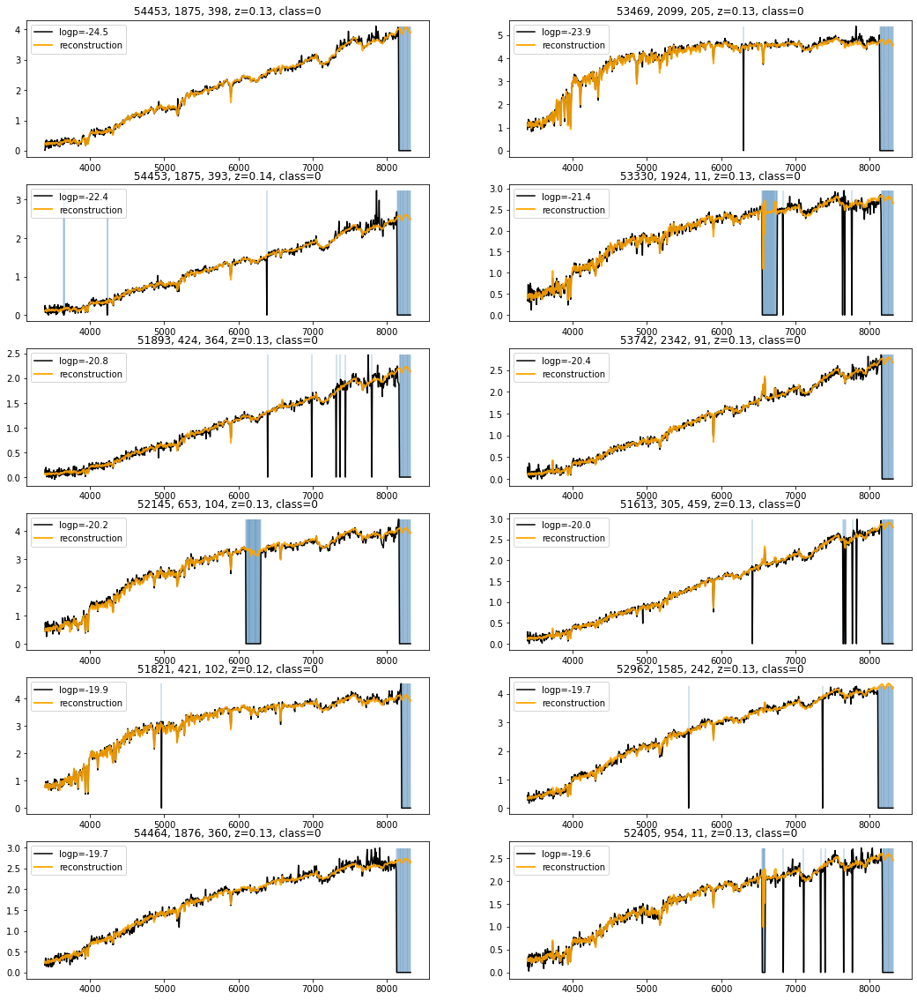

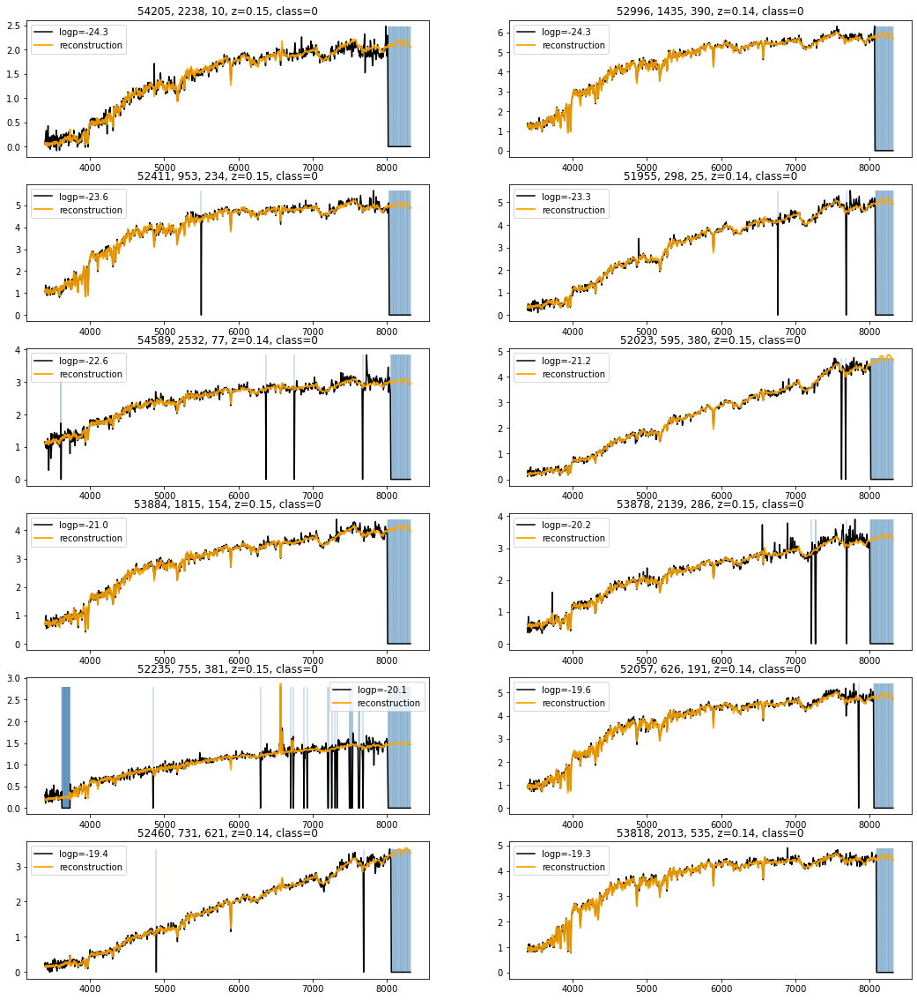

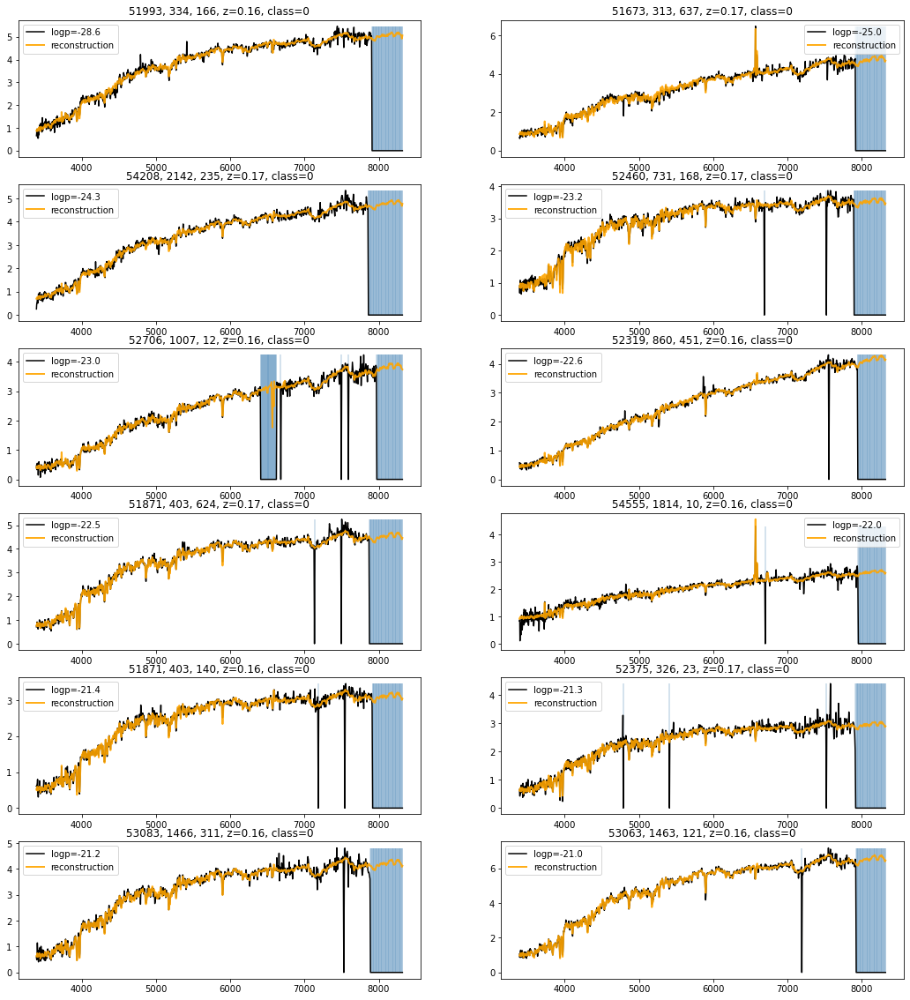

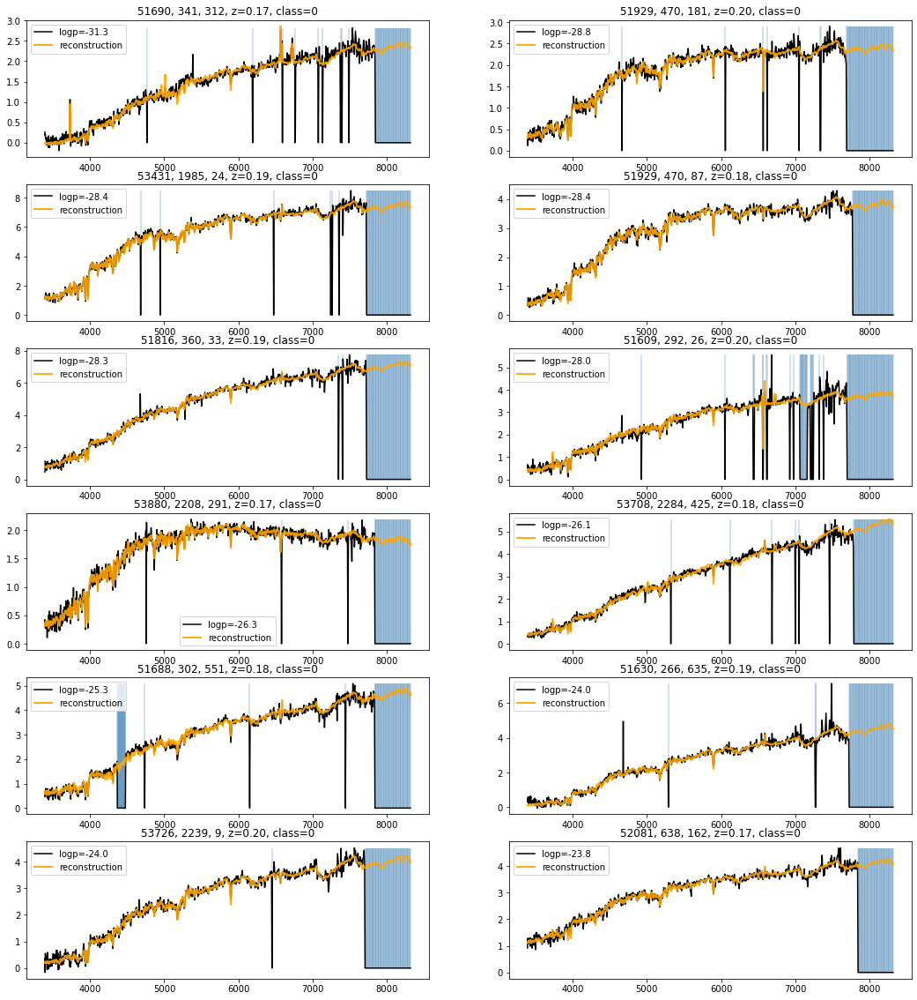

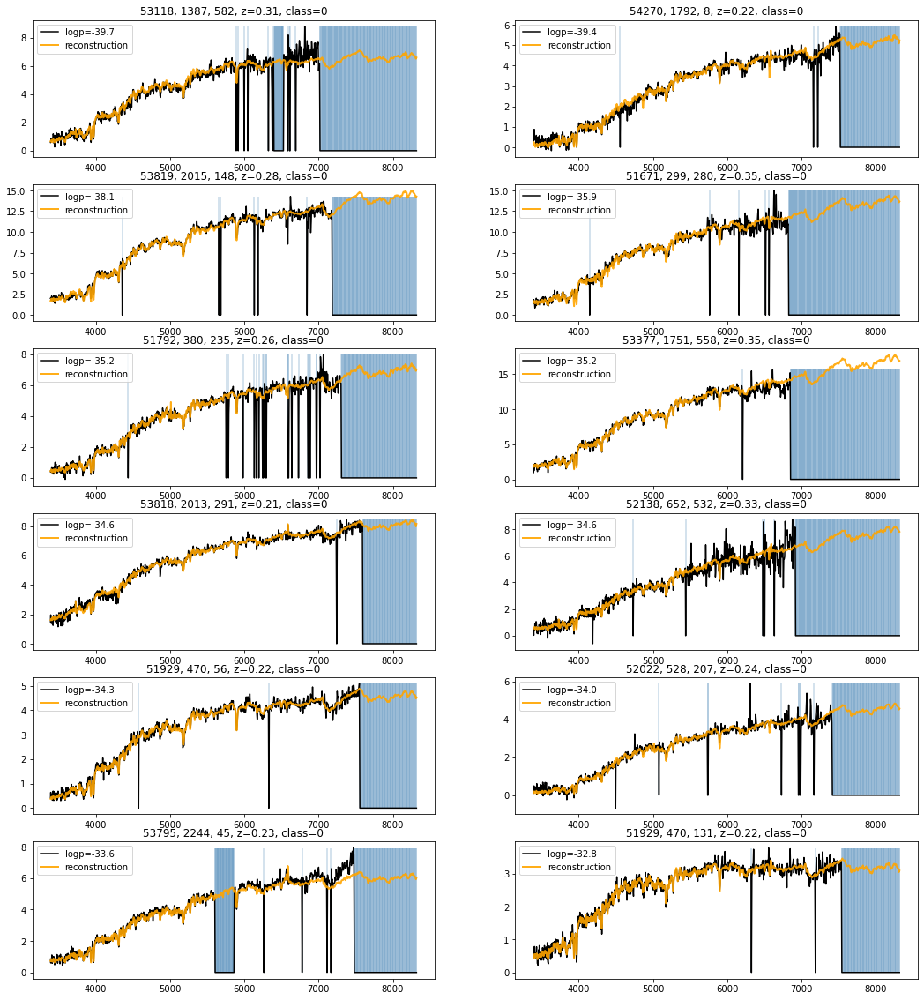

In [13]:
wlmin, wlmax      = (3388,8318)
fixed_num_bins    = 1000
wl_range          = (np.log10(wlmin),np.log10(wlmax))
new_wl            = np.logspace(wl_range[0],wl_range[1],fixed_num_bins+1)

for nn, data in enumerate(ood):
    fi, ax = plt.subplots(6,2,figsize=(18,20))
    ax  = ax.flatten()
    ind = data.index
    for jj in range(12):
        ii = ind[jj]
        ax[jj].set_title('%d, %d, %d, z=%.2f, class=%d'%(data['MJD'].loc[ii],data['plate'].loc[ii],data['fiber'].loc[ii],data['z'].loc[ii],data['label'].loc[ii]))
        ax[jj].plot(new_wl[1:],valid_1['spec'][ii], color='black',label='logp=%.1f'%data['logp'].loc[ii])
        ax[jj].vlines(x=new_wl[1:][np.squeeze(~valid_1['mask'][ii].astype(bool))], ymin=0,ymax=max(valid_1['spec'][ii]), color='steelblue',alpha=0.3)
        ax[jj].plot(new_wl[1:],decoded[ii], label='reconstruction',ls='-', color='orange', lw=2,alpha=0.9)

        ax[jj].legend()
#     if ii in [10,11]:
#         ax[ii].set_xlabel(r'restframe $\lambda$ [nm]')
#     if ii%2==0:
#         ax[ii].set_ylabel(r'standardized flux')        
# plt.tight_layout()
    plotpath='/global/cscratch1/sd/vboehm/SDSSOutlier/fc/plots'
    #plt.savefig(os.path.join(plotpath,'logp_AE2_outliers_class0_zbin_%d.pdf'%nn), bbox_inches='tight')
    plt.show()
# plt.close()

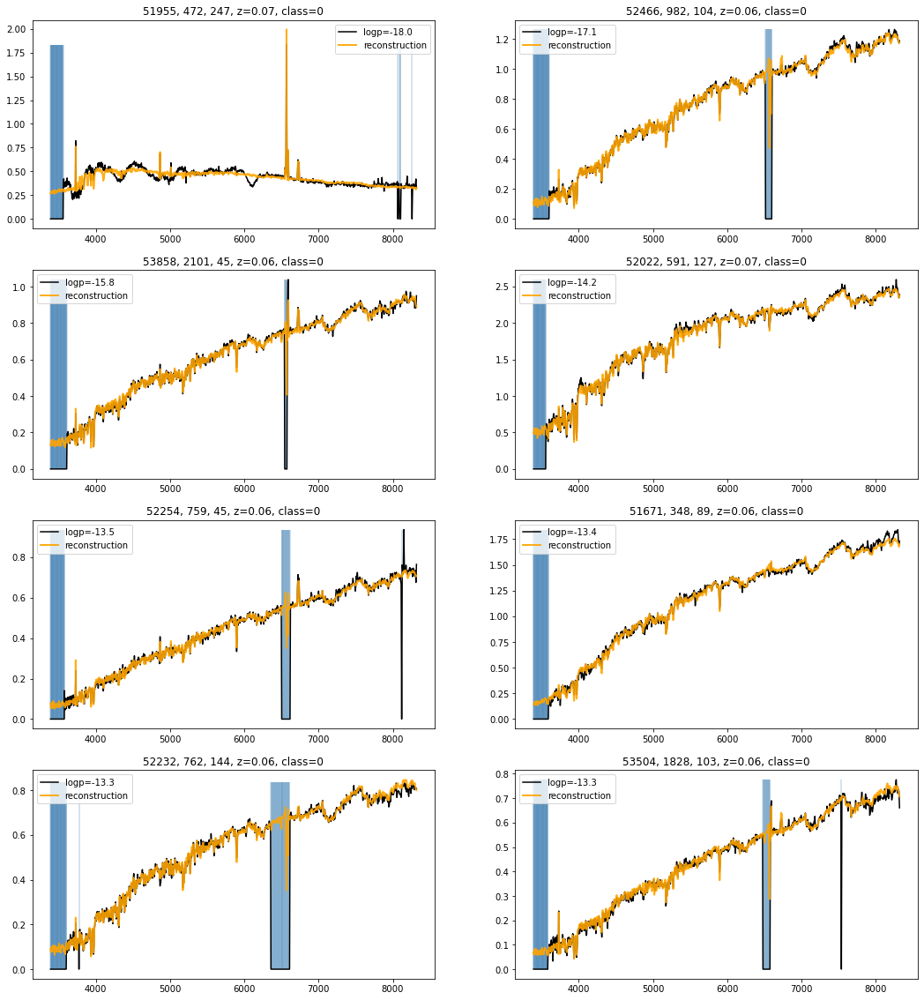

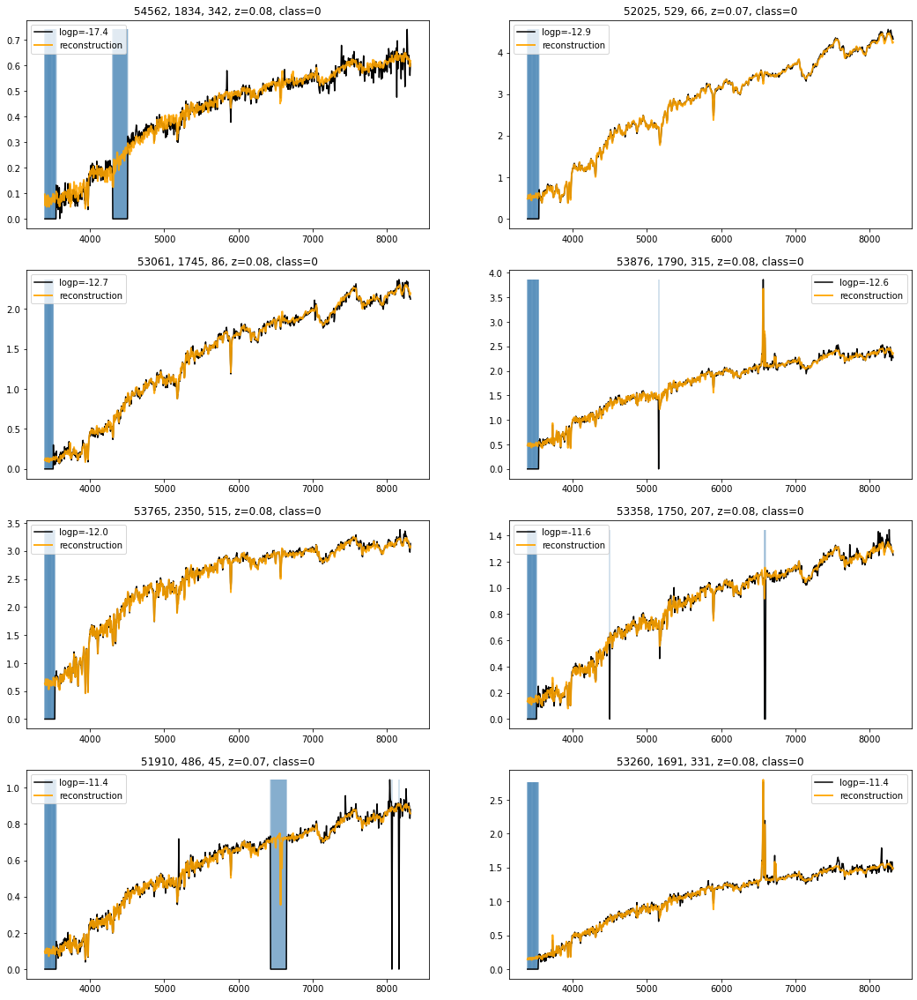

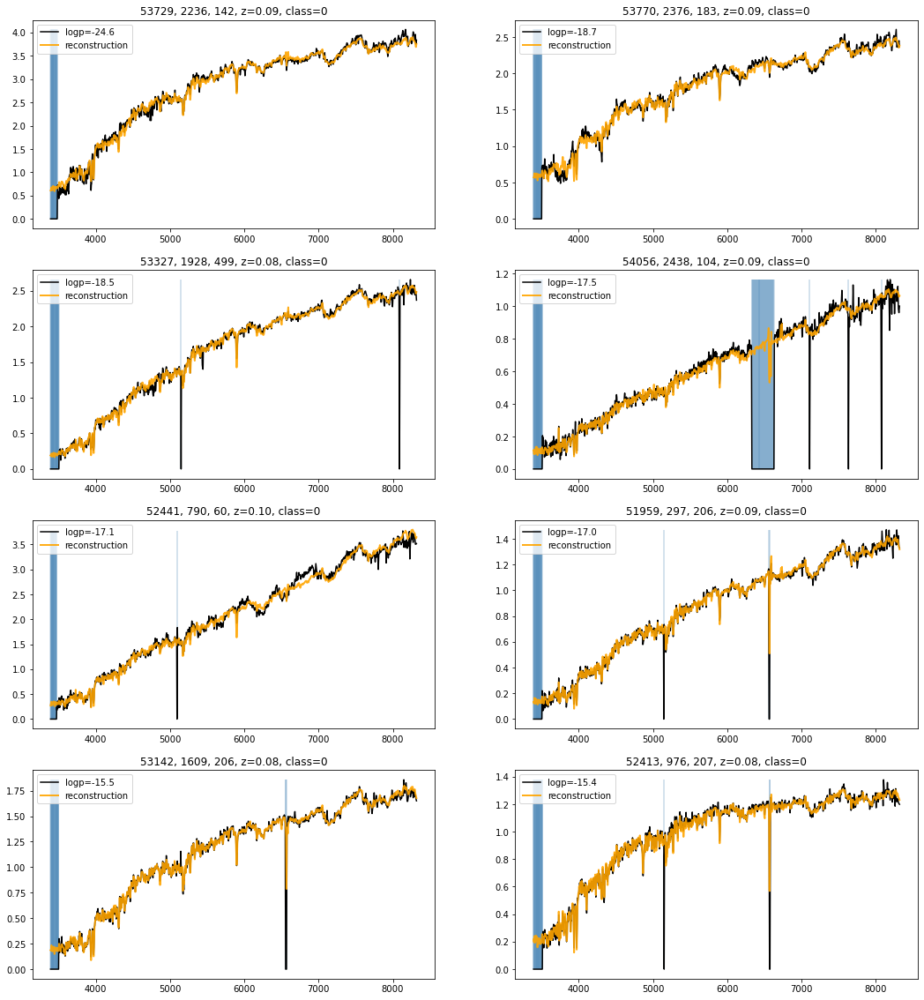

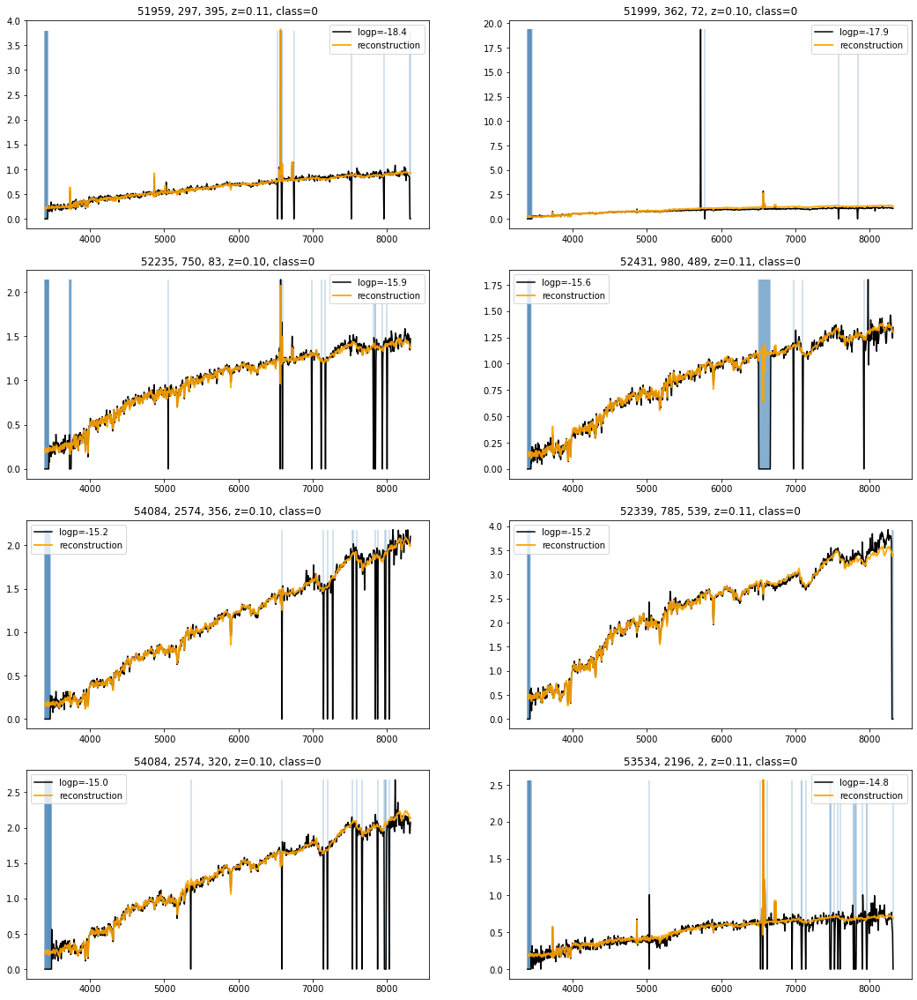

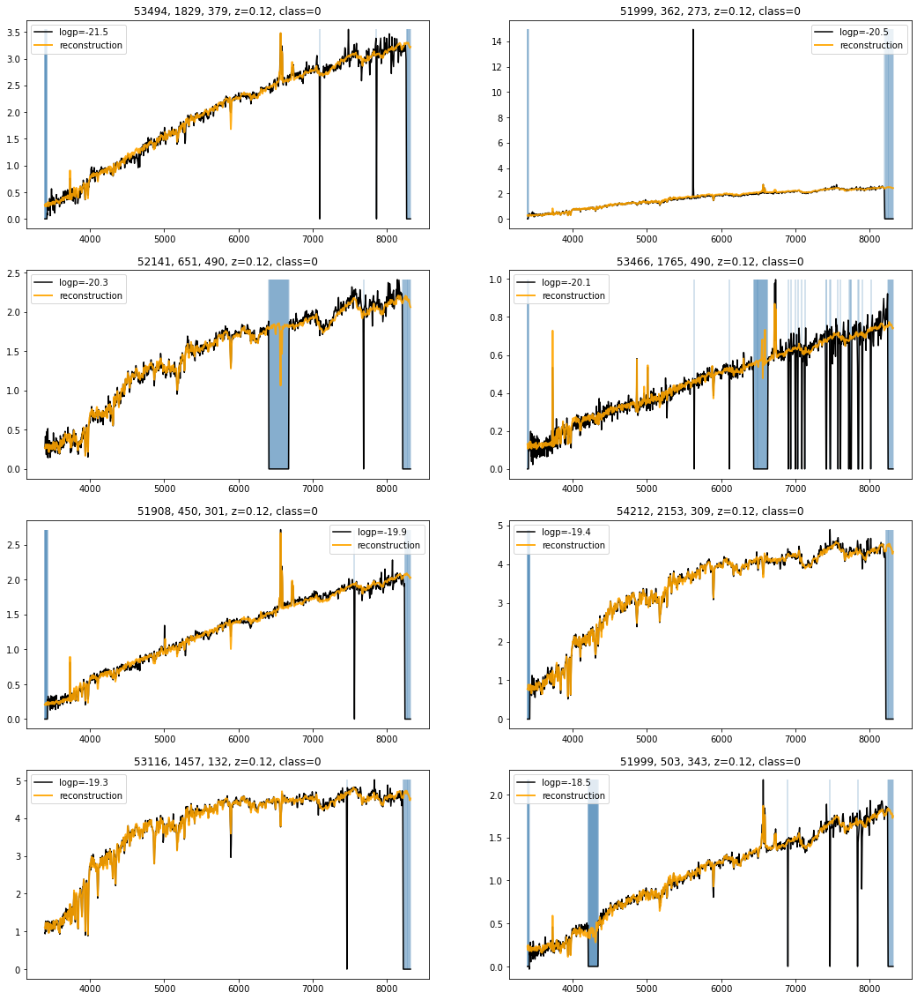

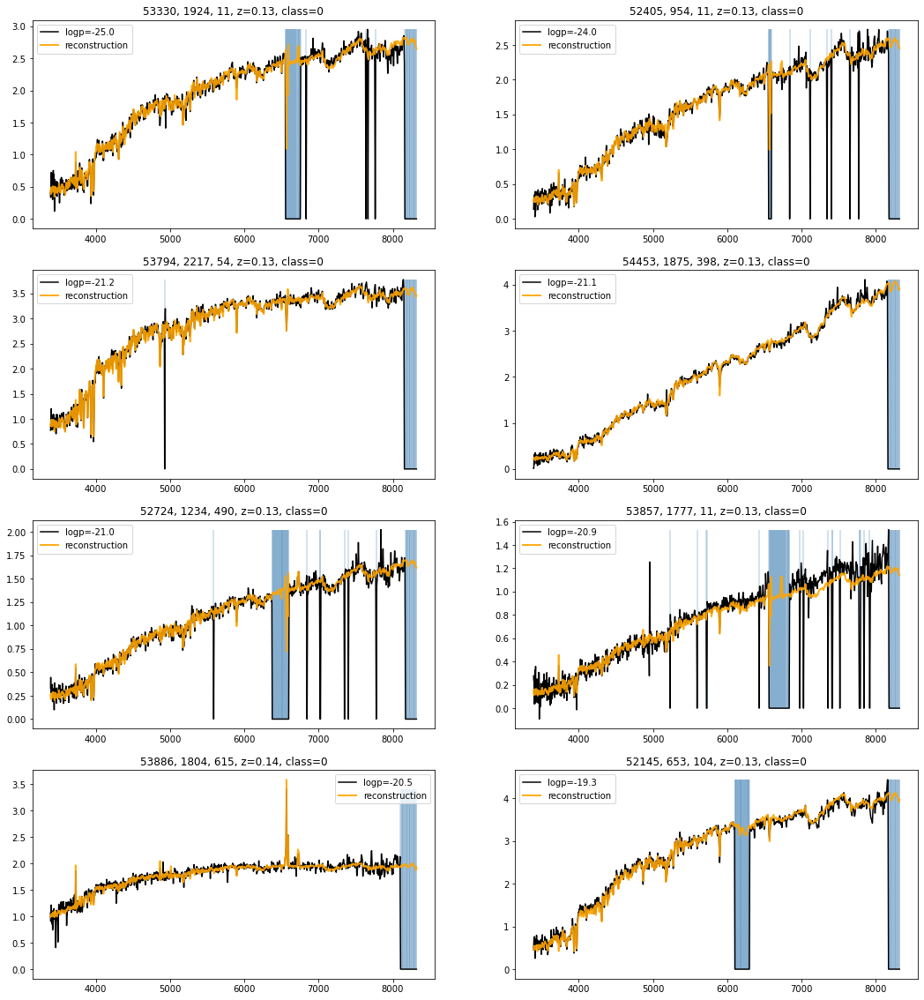

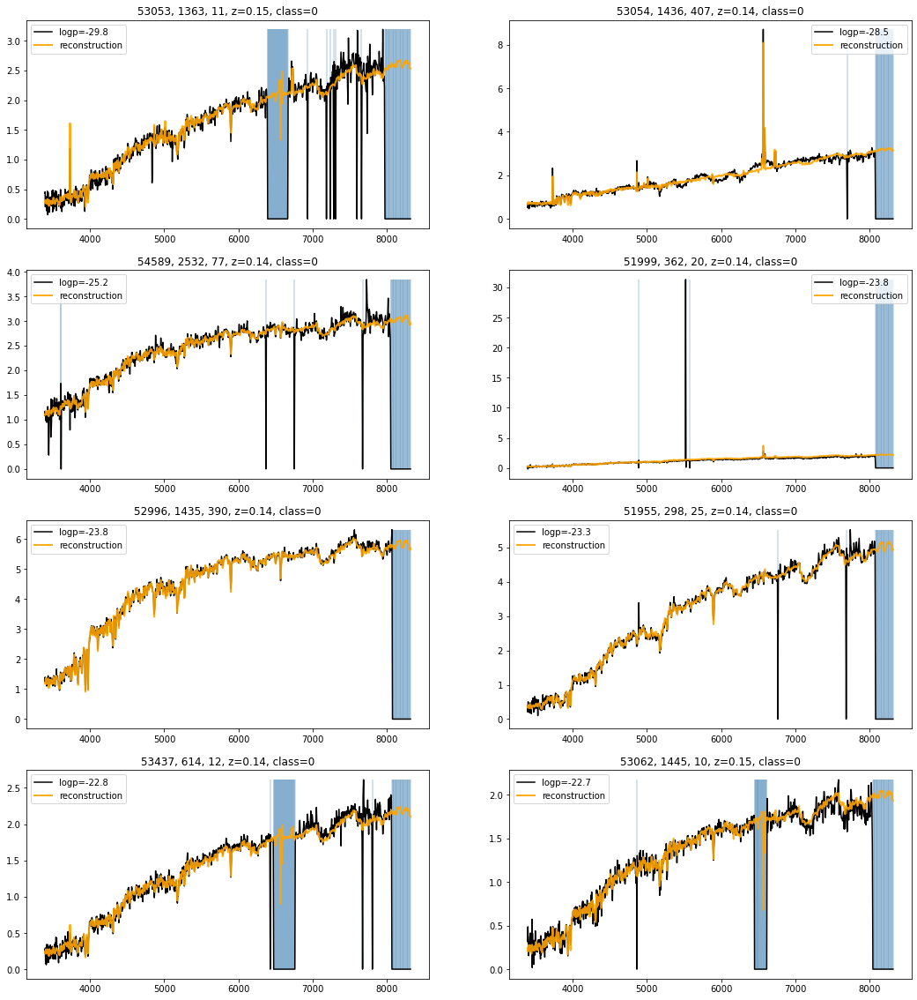

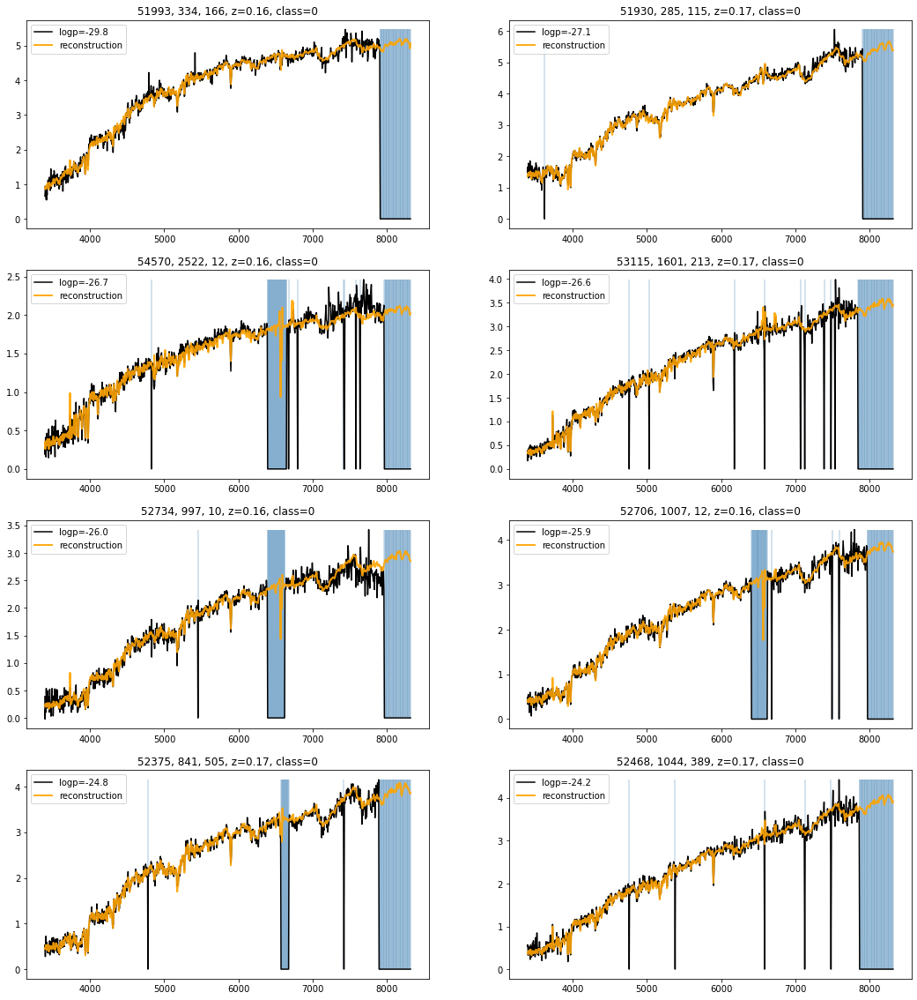

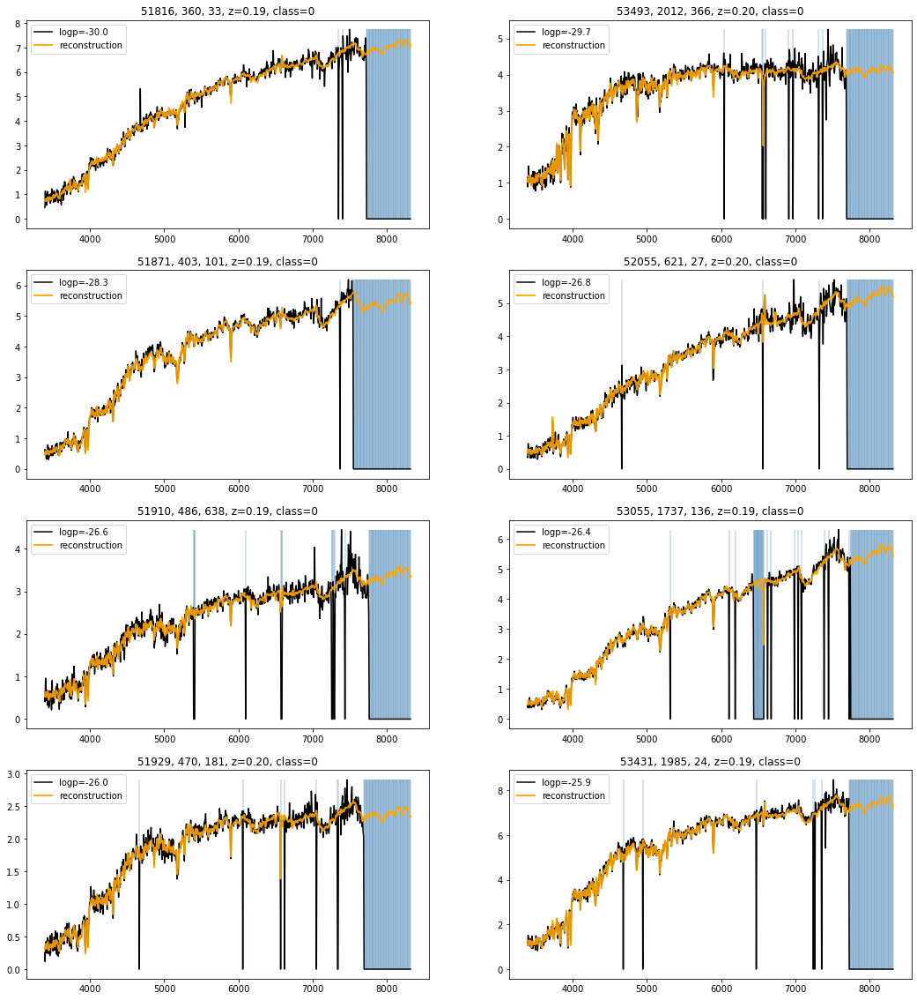

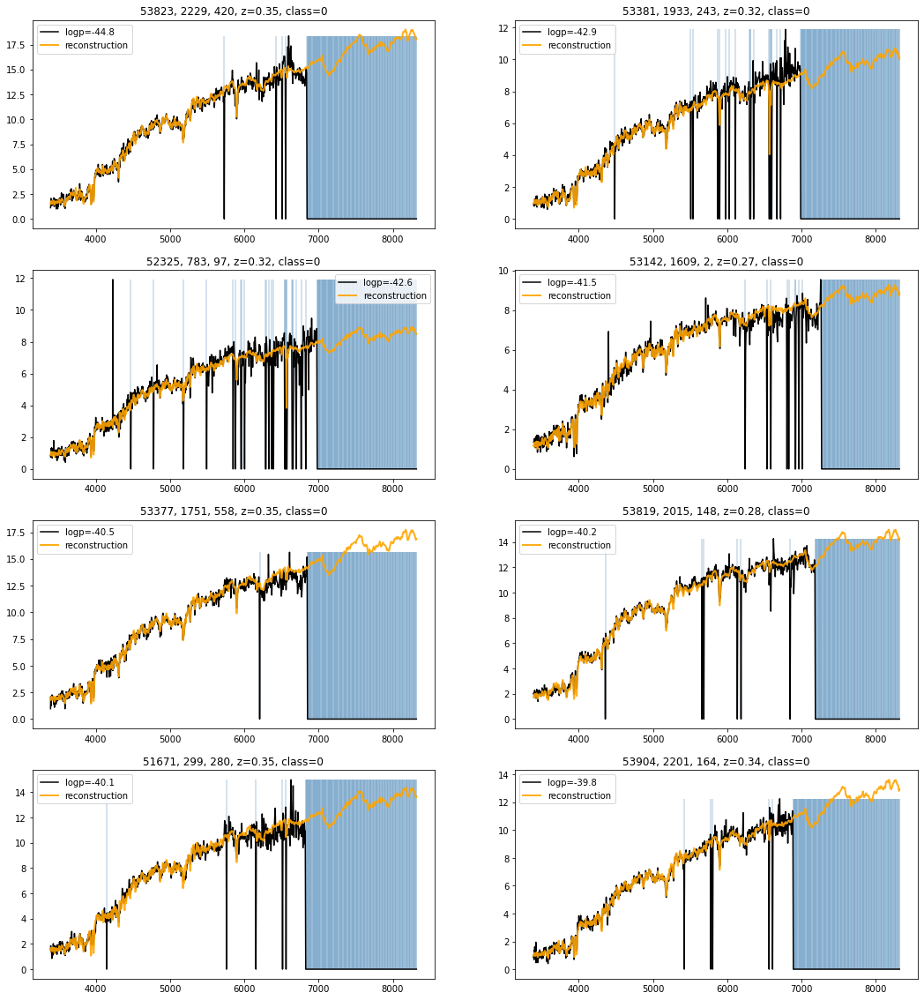

In [15]:
wlmin, wlmax      = (3388,8318)
fixed_num_bins    = 1000
wl_range          = (np.log10(wlmin),np.log10(wlmax))
new_wl            = np.logspace(wl_range[0],wl_range[1],fixed_num_bins+1)

for nn, data in enumerate(ood):
    fi, ax = plt.subplots(4,2,figsize=(18,20))
    ax  = ax.flatten()
    ind = data.index
    for jj in range(8):
        ii = ind[jj]
        ax[jj].set_title('%d, %d, %d, z=%.2f, class=%d'%(data['MJD'].loc[ii],data['plate'].loc[ii],data['fiber'].loc[ii],data['z'].loc[ii],data['label'].loc[ii]))
        ax[jj].plot(new_wl[1:],valid_1['spec'][ii], color='black',label='logp=%.1f'%data['logp'].loc[ii])
        ax[jj].vlines(x=new_wl[1:][np.squeeze(~valid_1['mask'][ii].astype(bool))], ymin=0,ymax=max(valid_1['spec'][ii]), color='steelblue',alpha=0.3)
        ax[jj].plot(new_wl[1:],decoded[ii], label='reconstruction',ls='-', color='orange', lw=2,alpha=0.9)

        ax[jj].legend()
#     if ii in [10,11]:
#         ax[ii].set_xlabel(r'restframe $\lambda$ [nm]')
#     if ii%2==0:
#         ax[ii].set_ylabel(r'standardized flux')        
# plt.tight_layout()
    plotpath='/global/cscratch1/sd/vboehm/SDSSOutlier/fc/plots'
    #plt.savefig(os.path.join(plotpath,'logp_AE2_outliers_class0_zbin_%d.pdf'%nn), bbox_inches='tight')
    plt.show()
# plt.close()

In [84]:
classes = np.unique(labels,return_counts=True)[1]
print(classes/np.sum(classes))

[4.29089086e-01 8.63219708e-02 5.79346892e-02 8.87997708e-03
 8.44170725e-02 9.16642796e-04 2.84144944e-01 2.25580063e-02
 1.38928674e-03 6.93211114e-03 3.07934689e-03 1.93354340e-03
 6.87482097e-04 8.36436551e-03 1.57547981e-04 3.19392724e-03]


In [ ]:
pickle.dump(valid_1,open(os.path.join('/global/cscratch1/sd/vboehm/SDSSOutlier/','combined_comparison.pkl'),'wb'))

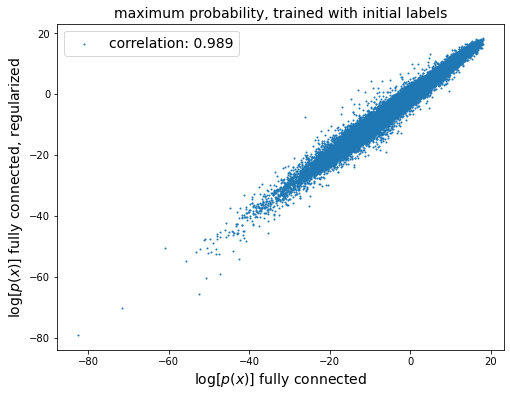

In [16]:
plt.figure(figsize=(8,6))
plt.title('maximum probability, trained with initial labels', fontsize=14)
plt.scatter(valid_1['log_p_max_fc_1'],valid_1['log_p_max_fc2_1d'], s=1, label='correlation: %.3f'%stats.pearsonr(valid_1['log_p_max_fc_1'],valid_1['log_p_max_fc2_1d'])[0])
plt.xlabel(r'$\log[p(x)]$ fully connected', fontsize=14)
plt.ylabel(r'$\log[p(x)]$ fully connected, regularized', fontsize=14)
plt.legend( fontsize=14)
plt.show()

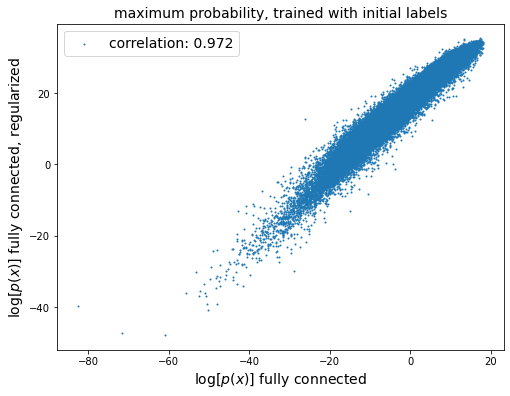

In [8]:
plt.figure(figsize=(8,6))
plt.title('maximum probability, trained with initial labels', fontsize=14)
plt.scatter(valid_1['log_p_max_fc_1'],valid_2['log_p_max_fc_norm1'], s=1, label='correlation: %.3f'%stats.pearsonr(valid_1['log_p_max_fc_1'],valid_2['log_p_max_fc_norm1'])[0])
plt.xlabel(r'$\log[p(x)]$ fully connected', fontsize=14)
plt.ylabel(r'$\log[p(x)]$ fully connected, regularized', fontsize=14)
plt.legend( fontsize=14)
plt.show()

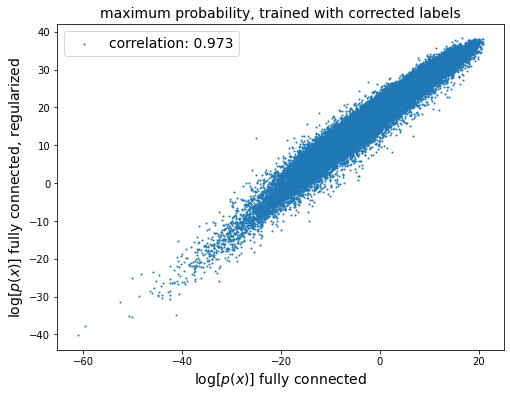

In [9]:
plt.figure(figsize=(8,6))
plt.title('maximum probability, trained with corrected labels', fontsize=14)
plt.scatter(valid_1['log_p_max_fc_2'],valid_2['log_p_max_fc_norm2'], s=1, label='correlation: %.3f'%stats.pearsonr(valid_1['log_p_max_fc_2'],valid_2['log_p_max_fc_norm2'])[0])
plt.xlabel(r'$\log[p(x)]$ fully connected', fontsize=14)
plt.ylabel(r'$\log[p(x)]$ fully connected, regularized', fontsize=14)
plt.legend(fontsize=14)
plt.show()

In [10]:
### very similar dependence on masks, logps seem only different by constant shift and maybe slight rescaling

In [17]:
valid_2.keys()

odict_keys(['spec', 'mask', 'noise', 'z', 'RA', 'DEC', 'class', 'subclass', 'SN', 'MJD', 'plate', 'fiber', 'mean', 'std', 'labels', 'new_inf_labels', 'max_label_fc_norm1', 'log_p_fc_norm1', 'log_p_fc_norm1_marg_flat', 'log_p_max_fc_norm1', 'log_p_fc_norm1_marg', 'max_label_fc_norm2', 'log_p_max_fc_norm2', 'log_p_fc_norm2', 'log_p_fc_norm2_marg', 'log_p_fc_norm2_marg_flat'])

In [22]:
ind = np.where(np.asarray(valid_2['new_inf_labels'])==0)[0]

In [34]:
ind1 = np.where(np.asarray(valid_2['max_label_fc_norm1']))
ind2 = np.where(np.asarray(valid_1['max_label_fc_1']))
ind3 = np.where(np.asarray(valid_3['max_label_cnn_norm1']))

Text(0.5, 0, 'masked fraction')

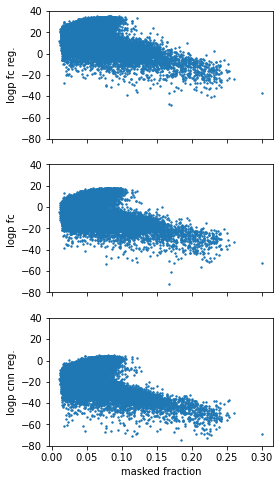

In [35]:
fig, ax = plt.subplots(3,1, sharex=True,figsize=(4,8))
ax[0].scatter(mask_fracs[ind1],valid_2['log_p_max_fc_norm1'][ind1],s=2)#,c=np.asarray(valid_2['new_inf_labels']))
ax[1].scatter(mask_fracs[ind2],valid_1['log_p_max_fc_1'][ind2], s=2)#,c=np.asarray(valid_2['new_inf_labels']))
ax[2].scatter(mask_fracs[ind3],valid_3['log_p_max_cnn_norm1'][ind3],s=2)
ax[0].set_ylim(-80,40)
ax[1].set_ylim(-80,40)
ax[2].set_ylim(-80,40)
#ax[0].set_colorbar()
ax[0].set_ylabel('logp fc reg.')
ax[1].set_ylabel('logp fc ')
ax[2].set_ylabel('logp cnn reg.')
ax[2].set_xlabel('masked fraction')

Text(0.5, 0, 'z')

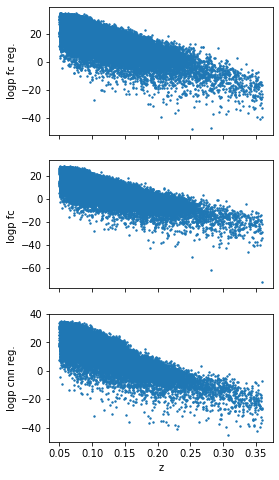

In [36]:
fig, ax = plt.subplots(3,1, sharex=True,figsize=(4,8))
ax[0].scatter(valid_2['z'][ind1],valid_2['log_p_max_fc_norm1'][ind1],s=2)#,c=np.asarray(valid_2['new_inf_labels']))
ax[1].scatter(valid_1['z'][ind2],valid_1['log_p_max_fc_1'][ind2]+10, s=2)#,c=np.asarray(valid_2['new_inf_labels']))
ax[2].scatter(valid_3['z'][ind3],valid_3['log_p_max_cnn_norm1'][ind3]+30,s=2)#,c=np.asarray(valid_2['new_inf_labels']))
plt.ylim(-50,40)
ax[0].set_ylabel('logp fc reg.')
ax[1].set_ylabel('logp fc ')
ax[2].set_ylabel('logp cnn reg.')
ax[2].set_xlabel('z')

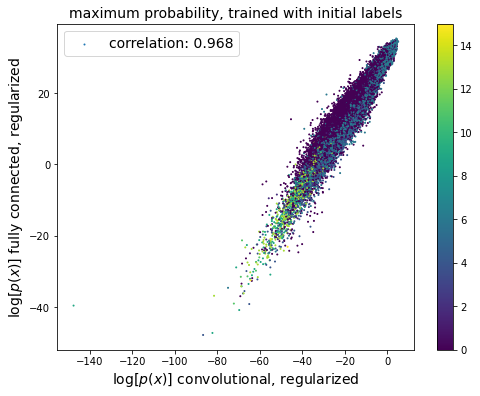

In [13]:
plt.figure(figsize=(8,6))
plt.title('maximum probability, trained with initial labels', fontsize=14)
plt.scatter(valid_3['log_p_max_cnn_norm1'],valid_2['log_p_max_fc_norm1'], s=1, label='correlation: %.3f'%stats.pearsonr(valid_3['log_p_max_cnn_norm1'],valid_2['log_p_max_fc_norm1'])[0],
           c=valid_3['new_inf_labels'])
plt.xlabel(r'$\log[p(x)]$ convolutional, regularized', fontsize=14)
plt.ylabel(r'$\log[p(x)]$ fully connected, regularized', fontsize=14)
plt.legend( fontsize=14)
plt.colorbar()
plt.show()

In [22]:
valid_3.keys()

odict_keys(['spec', 'mask', 'noise', 'z', 'RA', 'DEC', 'class', 'subclass', 'SN', 'MJD', 'plate', 'fiber', 'mean', 'std', 'labels', 'new_inf_labels', 'max_label_cnn_norm1', 'log_p_max_cnn_norm1', 'log_p_cnn_norm1', 'log_p_cnn_norm1_marg', 'log_p_cnn_norm1_marg_flat'])

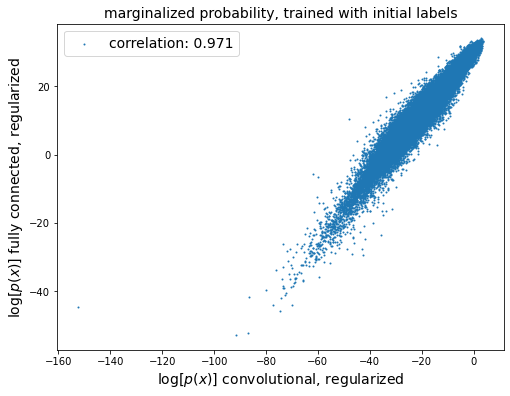

In [19]:
plt.figure(figsize=(8,6))
plt.title('marginalized probability, trained with initial labels', fontsize=14)
plt.scatter(valid_3['log_p_cnn_norm1_marg'],valid_2['log_p_fc_norm1_marg'], s=1, label='correlation: %.3f'%stats.pearsonr(valid_3['log_p_cnn_norm1_marg'],valid_2['log_p_fc_norm1_marg'])[0])
plt.xlabel(r'$\log[p(x)]$ convolutional, regularized', fontsize=14)
plt.ylabel(r'$\log[p(x)]$ fully connected, regularized', fontsize=14)
plt.legend( fontsize=14)
plt.show()

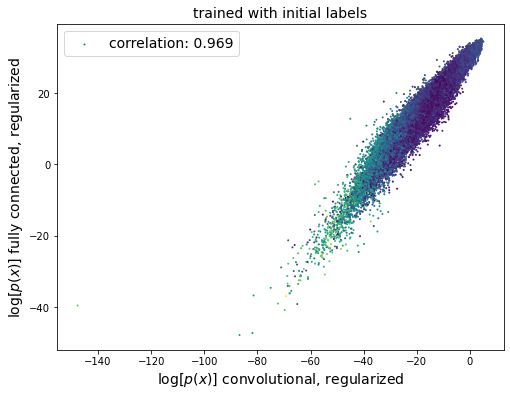

In [71]:
plt.figure(figsize=(8,6))
plt.title('trained with initial labels', fontsize=14)
plt.scatter(valid_3['log_p_cnn_norm1_marg_flat'],valid_2['log_p_fc_norm1_marg_flat'], s=1, label='correlation: %.3f'%stats.pearsonr(valid_3['log_p_cnn_norm1_marg_flat'],valid_2['log_p_fc_norm1_marg_flat'])[0],c=mask_fracs)
plt.xlabel(r'$\log[p(x)]$ convolutional, regularized', fontsize=14)
plt.ylabel(r'$\log[p(x)]$ fully connected, regularized', fontsize=14)
plt.legend( fontsize=14)
plt.show()

In [42]:
delta_logp = abs((valid_2['log_p_max_fc_norm1']-np.mean(valid_2['log_p_max_fc_norm1']))-(valid_3['log_p_max_cnn_norm1']-np.mean(valid_3['log_p_max_cnn_norm1'])))
ind = np.argsort(delta_logp)

odict_keys(['spec', 'mask', 'noise', 'z', 'RA', 'DEC', 'class', 'subclass', 'SN', 'MJD', 'plate', 'fiber', 'mean', 'std', 'labels', 'new_inf_labels', 'max_label_fc_norm1', 'log_p_fc_norm1', 'log_p_fc_norm1_marg_flat', 'log_p_max_fc_norm1', 'log_p_fc_norm1_marg', 'max_label_fc_norm2', 'log_p_max_fc_norm2', 'log_p_fc_norm2', 'log_p_fc_norm2_marg', 'log_p_fc_norm2_marg_flat'])

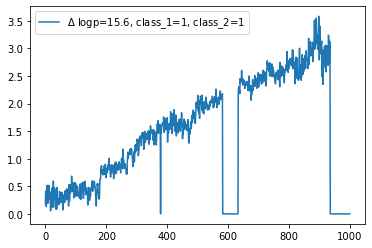

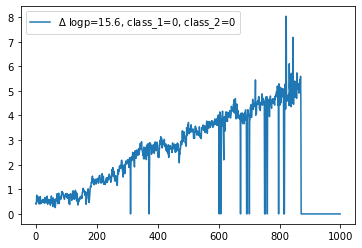

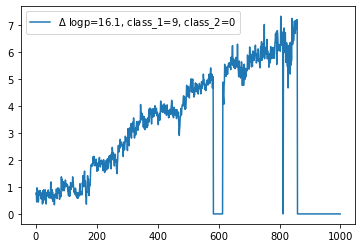

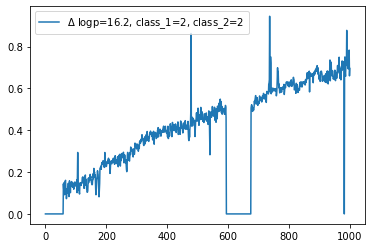

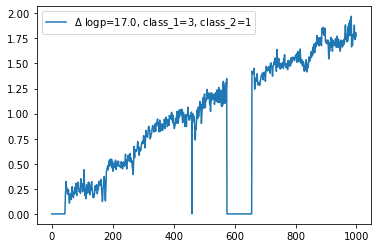

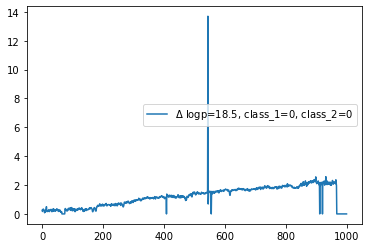

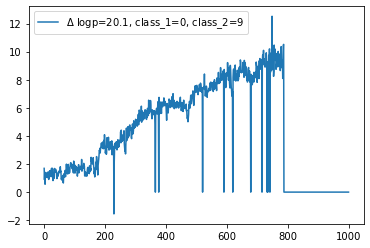

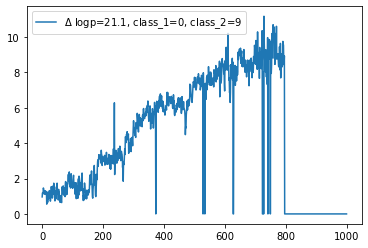

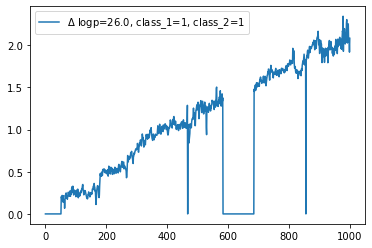

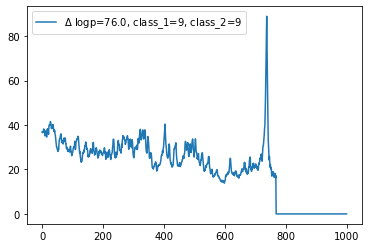

In [52]:
for ii in ind[-10::]:
    plt.plot(valid_2['spec'][ii], label=r'$\Delta$ logp=%.1f, class_1=%d, class_2=%d'%(delta_logp[ii],valid_2['max_label_fc_norm1'][ii],valid_3['max_label_cnn_norm1'][ii]))
    plt.legend()
    plt.show()


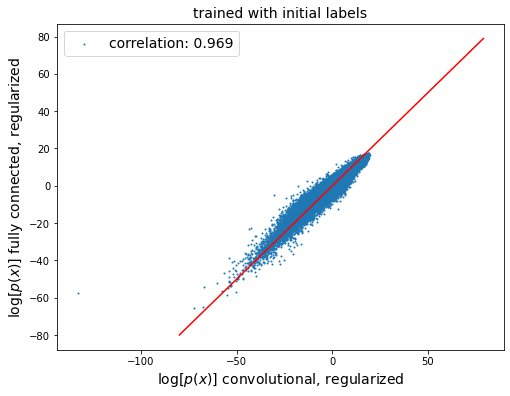

In [38]:
plt.figure(figsize=(8,6))
plt.title('trained with initial labels', fontsize=14)
plt.scatter(valid_3['log_p_cnn_norm1_marg_flat']-np.mean(valid_3['log_p_cnn_norm1_marg_flat']),valid_2['log_p_fc_norm1_marg_flat']-np.mean(valid_2['log_p_fc_norm1_marg_flat']), s=1, label='correlation: %.3f'%stats.pearsonr(valid_3['log_p_cnn_norm1_marg_flat'],valid_2['log_p_fc_norm1_marg_flat'])[0])
plt.xlabel(r'$\log[p(x)]$ convolutional, regularized', fontsize=14)
plt.ylabel(r'$\log[p(x)]$ fully connected, regularized', fontsize=14)
plt.plot(np.arange(-80,80),np.arange(-80,80),color='red')
plt.legend( fontsize=14)
plt.show()

In [65]:
import seaborn

<AxesSubplot:>

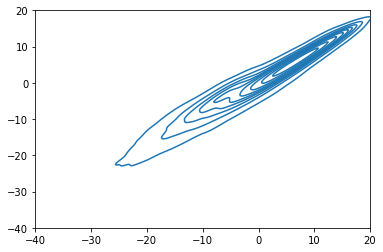

In [68]:
seaborn.kdeplot(valid_3['log_p_cnn_norm1_marg_flat']-np.mean(valid_3['log_p_cnn_norm1_marg_flat']),y=valid_2['log_p_fc_norm1_marg_flat']-np.mean(valid_2['log_p_fc_norm1_marg_flat']),clip=(-40,20))

In [15]:
valid_1.keys()

odict_keys(['spec', 'mask', 'noise', 'z', 'RA', 'DEC', 'class', 'subclass', 'SN', 'MJD', 'plate', 'fiber', 'mean', 'std', 'labels', 'new_inf_labels', 'max_label_fc_1', 'log_p_max_fc_1', 'log_p_fc_1', 'log_p_fc_1_marg', 'log_p_fc_1_marg_flat', 'max_label_fc_2', 'log_p_max_fc_2', 'log_p_fc_2', 'log_p_fc_2_marg', 'log_p_fc_2_marg_flat'])

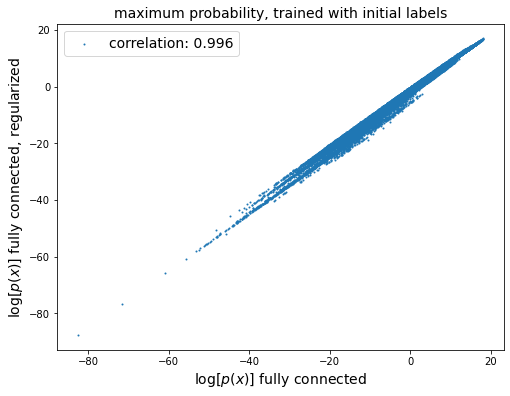

In [16]:
plt.figure(figsize=(8,6))
plt.title('maximum probability, trained with initial labels', fontsize=14)
plt.scatter(valid_1['log_p_max_fc_1'],valid_1['log_p_fc_1_marg'], s=1, label='correlation: %.3f'%stats.pearsonr(valid_1['log_p_max_fc_1'],valid_1['log_p_fc_1_marg'])[0])
plt.xlabel(r'$\log[p(x)]$ fully connected', fontsize=14)
plt.ylabel(r'$\log[p(x)]$ fully connected, regularized', fontsize=14)
plt.legend( fontsize=14)
plt.show()

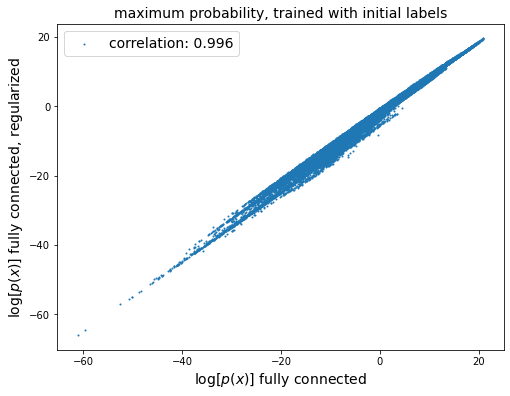

In [17]:
plt.figure(figsize=(8,6))
plt.title('maximum probability, trained with initial labels', fontsize=14)
plt.scatter(valid_1['log_p_max_fc_2'],valid_1['log_p_fc_2_marg'], s=1, label='correlation: %.3f'%stats.pearsonr(valid_1['log_p_max_fc_2'],valid_1['log_p_fc_2_marg'])[0])
plt.xlabel(r'$\log[p(x)]$ fully connected', fontsize=14)
plt.ylabel(r'$\log[p(x)]$ fully connected, regularized', fontsize=14)
plt.legend( fontsize=14)
plt.show()

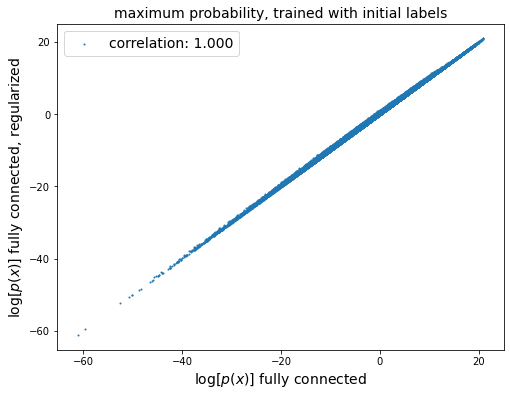

In [18]:
plt.figure(figsize=(8,6))
plt.title('maximum probability, trained with initial labels', fontsize=14)
plt.scatter(valid_1['log_p_max_fc_2'],valid_1['log_p_fc_2_marg_flat'], s=1, label='correlation: %.3f'%stats.pearsonr(valid_1['log_p_max_fc_2'],valid_1['log_p_fc_2_marg_flat'])[0])
plt.xlabel(r'$\log[p(x)]$ fully connected', fontsize=14)
plt.ylabel(r'$\log[p(x)]$ fully connected, regularized', fontsize=14)
plt.legend( fontsize=14)
plt.show()

In [4]:
line1 = np.load(os.path.join(data_path_1,'mean_loss_fc.npy'))
line2 = np.load(os.path.join(data_path_2,'mean_loss_fc_normed.npy'))
line3 = np.load(os.path.join(data_path_3,'mean_loss_cnn_normed.npy'))

In [7]:
max(line1), max(line3), np.sqrt(1.2808e+00)

(array([3.61731503]), array([11.1999275]), 1.1317243480636086)

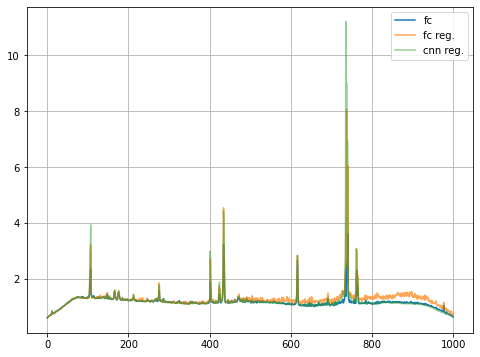

In [48]:
plt.figure(figsize=(8,6))
plt.plot(line1, label='fc')
plt.plot(line2, label='fc reg.', alpha=0.7)
plt.plot(line3, label='cnn reg.', alpha=0.5)
plt.grid()
plt.legend()
plt.show()

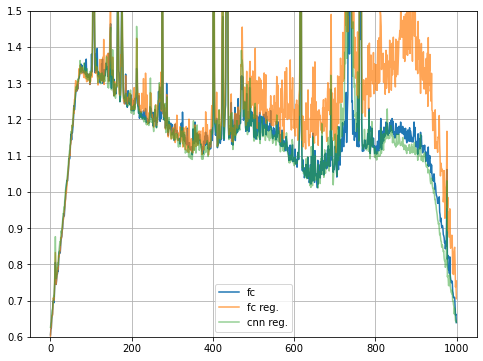

In [51]:
plt.figure(figsize=(8,6))
plt.plot(line1, label='fc')
plt.plot(line2, label='fc reg.', alpha=0.7)
plt.plot(line3, label='cnn reg.', alpha=0.5)
plt.grid()
plt.legend()
plt.ylim(0.6,1.5)
plt.show()